In [1]:
import pandas as pd
import numpy as np

import geopandas as gpd

import matplotlib.pyplot as plt
import matplotlib.lines as mlines

import seaborn as sns

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import os

from sklearn.decomposition import PCA

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics



In [2]:
def spatial_merge_left_join(plants_df, atmospheric_df):
    
    gdf_plants = gpd.GeoDataFrame(
        plants_df,
        geometry=gpd.points_from_xy(plants_df.Longitude, plants_df.Latitude),
        crs="EPSG:4326"
    )
    
    gdf_atmospheric = gpd.GeoDataFrame(
        atmospheric_df,
        geometry=gpd.points_from_xy(atmospheric_df.LONGITUDE, atmospheric_df.LATITUDE),
        crs="EPSG:4326"
    )

    LOCAL_CRS = "EPSG:5070" 
    gdf_plants_proj = gdf_plants.to_crs(LOCAL_CRS)
    gdf_atmospheric_proj = gdf_atmospheric.to_crs(LOCAL_CRS)

    power_plants_merged_gdf = gpd.sjoin_nearest(
        gdf_plants_proj, 
        gdf_atmospheric_proj,
        how="left", 
        distance_col="distance_meters"
    )
    
    power_plants_merged_gdf['distance_to_match'] = power_plants_merged_gdf['distance_meters'] / 1000.0

    final_df = pd.DataFrame(power_plants_merged_gdf.drop(columns=['geometry', 'index_right', 'distance_meters']))

    return final_df

def plot_map(map_title,
             x,
             y,
             c='blue',
             labels=None,
             cmap=False,
             s=1,
             edgecolor=None,
             linewidths=None,
             alpha=1,
             zorder=1):
    fig = plt.figure(figsize=(20,9))

    _map = fig.add_subplot(1, 1, 1, projection=ccrs.Mercator())

    _map.stock_img()

    _map.add_feature(cfeature.LAND, color='lightgray')

    _map.add_feature(cfeature.OCEAN, color='lightblue')

    _map.add_feature(cfeature.COASTLINE)

    _map.add_feature(cfeature.BORDERS, linestyle=':')

    _map.add_feature(cfeature.LAKES, alpha=0.5, color='lightblue')

    _map.add_feature(cfeature.RIVERS)

    if cmap:
        if edgecolor is not None:
            _map.scatter(x,
                         y,
                         c=c,
                         s=s,
                         cmap=cmap,
                         edgecolor=edgecolor,
                         linewidths=linewidths,
                         alpha=alpha,
                         zorder=zorder,
                         transform=ccrs.PlateCarree())
            
        else:
            _map.scatter(x,
                         y,
                         c=c,
                         s=s,
                         cmap=cmap,
                         alpha=alpha,
                         zorder=zorder,
                         transform=ccrs.PlateCarree())
        
    else:
        _map.scatter(x,
                     y,
                     c=c,
                     s=s,
                     alpha=alpha,
                     zorder=zorder,
                     transform=ccrs.PlateCarree())

    gl = _map.gridlines(draw_labels=True,
                        dms=True,
                        x_inline=False,
                        y_inline=False,
                        color='gray',
                        linestyle='--')

    gl.top_labels = False

    gl.right_labels = False
    
    handles = []

    if labels is not None:
        for i, category in enumerate(categories):
            handle = mlines.Line2D([], [], color=cmap(i), marker='o', linestyle='None',
                              markersize=10, label=category)

            handles.append(handle)

        _map.legend(handles=handles, title=f"{map_title}", bbox_to_anchor=(0, 0), loc='lower left')

    _map.set_title(f"{map_title}")

    plt.show()

# =============================================================================
# Code generated by Artificial Intelligence (Google AI)
# Date: 2025-12-05
# Prompt: "Python function to convert degrees F to degrees C"
# =============================================================================
def fahrenheit_to_celsius(fahrenheit_temp):
    """
    Converts a temperature from Fahrenheit (°F) to Celsius (°C).
    """
    celsius_temp = (fahrenheit_temp - 32) * 5/9
    return celsius_temp

# =============================================================================
# Code generated by Artificial Intelligence (Google AI)
# Date: 2025-12-05
# Prompt: "Python function to calculate relative humidity from NCEI dataset."
# =============================================================================
def calculate_relative_humidity(x):
    """
    Calculates relative humidity (%) using the Magnus approximation and accounts for pressure.
    
    Args:
        temperature_celsius (float): The current ambient air temperature in Celsius.
        dew_point_celsius (float): The dew point temperature in Celsius.
        station_pressure_hpa (float): The actual pressure at the station level in Hectopascals (hPa) or millibars (mb).
        
    Returns:
        float: The calculated relative humidity as a percentage.
    """
    
    temperature_celsius = x['TEMP_C']
    
    dew_point_celsius = x['DEWP']
    
    station_pressure_hpa = x['STP']
    
    # 1. Calculate Saturation Vapor Pressure (es) at current T (Magnus-Tetens formula)
    # Constants used for water vapor over water
    A = 17.625
    B = 243.04
    es = 6.112 * np.exp((A * temperature_celsius) / (B + temperature_celsius))
    # 2. Calculate Actual Vapor Pressure (e) at Td (e is es at dew point)
    e = 6.112 * np.exp((A * dew_point_celsius) / (B + dew_point_celsius))
    # 3. Apply the Enhancement Factor (f) - This is where pressure comes in
    # This factor corrects for the behavior of moist air at different pressures.
    f = 1 + (1e-6 * station_pressure_hpa * (4.5 + 6e-4 * temperature_celsius**2))
    # 4. Calculate RH
    # RH = (e / (f * es)) * 100
    # For most standard uses, f is very close to 1, and often omitted. 
    # The calculation is robust without it, but more reliable with it.
    
    RH = (e / (f * es)) * 100
    
    # Constrain the result to physical limits
    RH = max(0, min(100, RH))
    return RH

<h3>Step 1: Data Cleaning & EDA</h3>

Document at least 5 data quality issues you found and how you fixed them.<br>
[ ]<br>
[ ]<br>
[ ]<br>
[ ]<br>
[ ]<br>

Create at least 4-6 visualizations showing distributions, relationships, and potential patterns (aim for 6+ for excellent work).<br>
[ ] NASA Rainforest map vs. atmospheric data classifier.<br>
[ ] Global Map of Power Plants.<br>
[ ]<br>
[ ]<br>

Explain what you notice in plain language.<br>

In [3]:
ncei_atmospheric = pd.read_csv('data/full_atmospheric.csv', index_col=0)

In [4]:
ncei_stations_id = pd.read_csv('data/ncei_stations_id.csv', index_col=0)

In [5]:
power_plants = pd.read_csv('data/power_plant_distance_to_water.csv', index_col=0)

power_plants

,Powerplant Name,gppd_idnr,Capacity (MW),Primary Fuel,Owner,Source,distance_to_water_km,Longitude,Latitude
0,Kajaki Hydroelectric Power Plant Afghanistan,GEODB0040538,33.00,Hydro,NaN,GEODB,1.275908,65.1190,32.3220
1,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.00,Hydro,NaN,GEODB,90.086085,69.4787,34.5560
2,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.00,Hydro,NaN,GEODB,111.968838,69.7170,34.6410
3,Nangarhar (Darunta) Hydroelectric Power Plant ...,GEODB0040536,11.55,Hydro,NaN,GEODB,170.947720,70.3633,34.4847
4,Northwest Kabul Power Plant Afghanistan,GEODB0040540,42.00,Gas,NaN,GEODB,56.819837,69.1134,34.5638
...,...,...,...,...,...,...,...,...,...
29905,Ndola,WRI1022386,50.00,Oil,ZESCO,Energy Regulation Board of Zambia,52.953034,28.6333,-12.9667
29906,Nkana,WRI1022384,20.00,Oil,ZESCO,Energy Regulation Board of Zambia,7.135709,28.2000,-12.8167
29907,Victoria Falls,WRI1022380,108.00,Hydro,ZESCO,Energy Regulation Board of Zambia,0.609805,25.8500,-17.9167
29908,Hwange Coal Power Plant Zimbabwe,GEODB0040404,920.00,Coal,NaN,GEODB,32.309980,26.4700,-18.3835


/var/folders/gl/919514x5085c7h3zzn_f471w0000gp/T/ipykernel_62349/3158995857.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(cmap_name, num_categories)


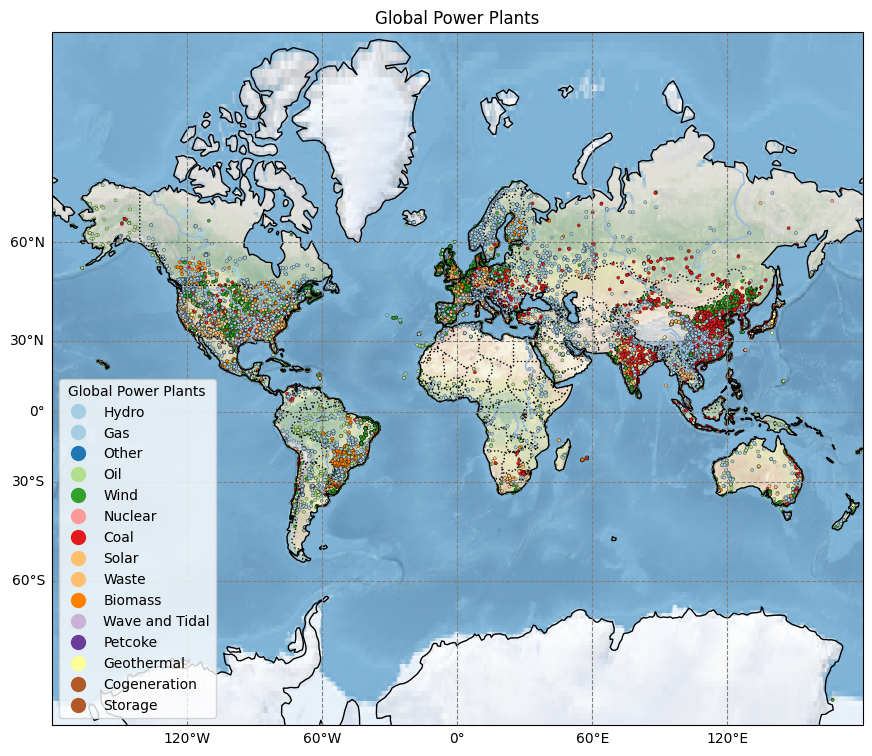

In [6]:
levels, categories = pd.factorize(power_plants[f"Primary Fuel"])

num_categories = len(categories)

cmap_name = 'Paired'

cmap = plt.cm.get_cmap(cmap_name, num_categories)

plot_map(f"Global Power Plants",
             power_plants['Longitude'],
             power_plants['Latitude'],
             c=levels,
             labels=power_plants[f"Primary Fuel"],
             cmap=cmap,
             s=5,
             edgecolor='black',
             linewidths=0.2)

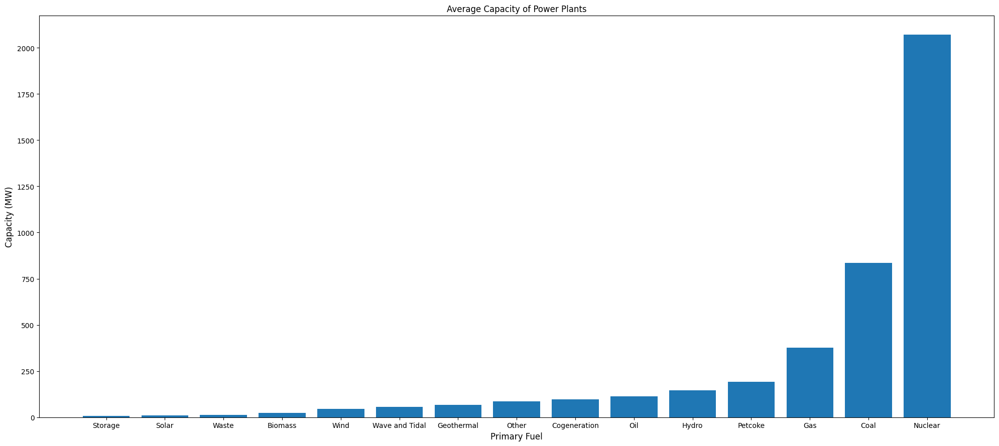

In [7]:
fig = plt.figure(figsize=(20,9))

power_plant_capacity = power_plants.groupby('Primary Fuel')['Capacity (MW)'].mean()

plt.bar(power_plant_capacity.sort_values().index,power_plant_capacity.sort_values())

plt.title("Average Capacity of Power Plants")

plt.xlabel("Primary Fuel", fontsize=12)

plt.ylabel("Capacity (MW)", fontsize=12)

plt.tight_layout()

plt.show()

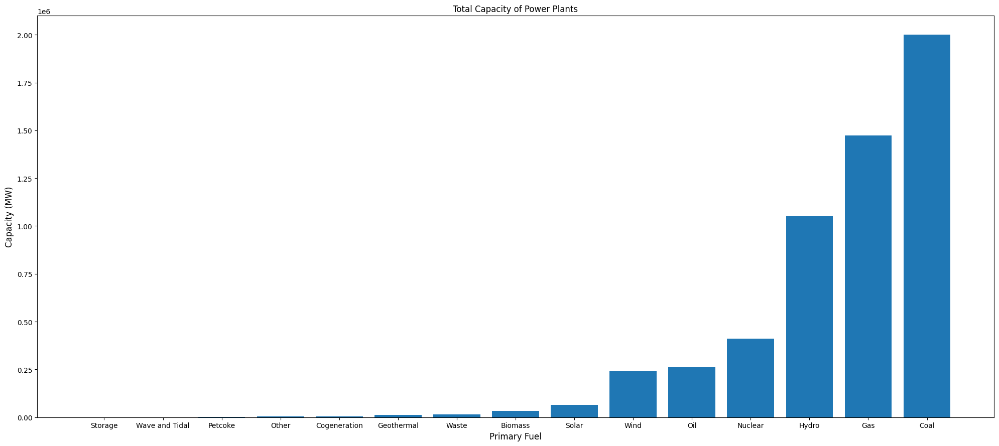

In [8]:
fig = plt.figure(figsize=(20,9))

power_plant_capacity = power_plants.groupby('Primary Fuel')['Capacity (MW)'].sum()

plt.bar(power_plant_capacity.sort_values().index,power_plant_capacity.sort_values())

plt.title("Total Capacity of Power Plants")

plt.xlabel("Primary Fuel", fontsize=12)

plt.ylabel("Capacity (MW)", fontsize=12)

plt.tight_layout()

plt.show()

In [9]:
power_plants['Capacity (MW)'].sum()

5572077.7622569995

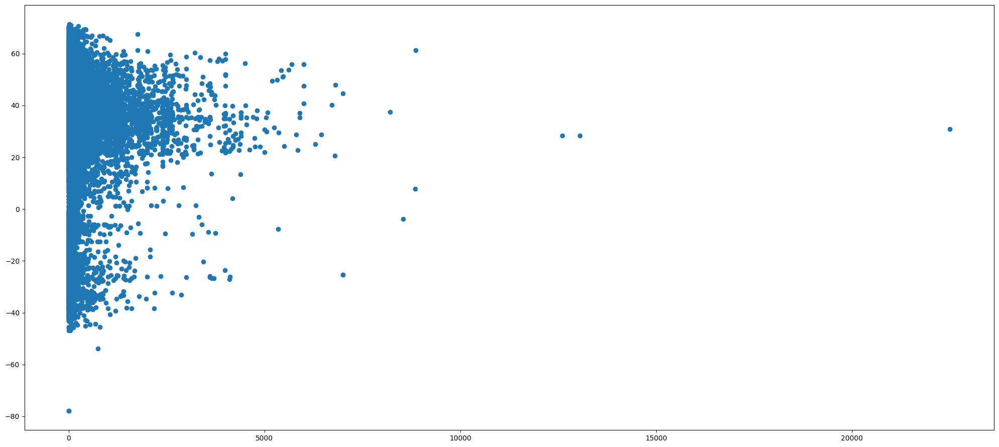

In [10]:
fig = plt.figure(figsize=(20,9))

plt.scatter(power_plants['Capacity (MW)'], power_plants['Latitude'])

plt.title("")

plt.xlabel("", fontsize=12)

plt.ylabel("", fontsize=12)

plt.tight_layout()

plt.show()

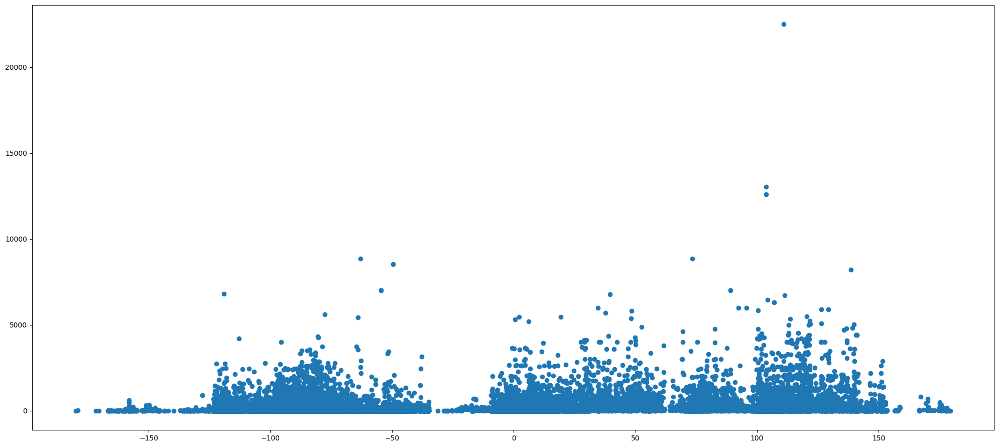

In [11]:
fig = plt.figure(figsize=(20,9))

plt.scatter(power_plants['Longitude'], power_plants['Capacity (MW)'])

plt.title("")

plt.xlabel("", fontsize=12)

plt.ylabel("", fontsize=12)

plt.tight_layout()

plt.show()

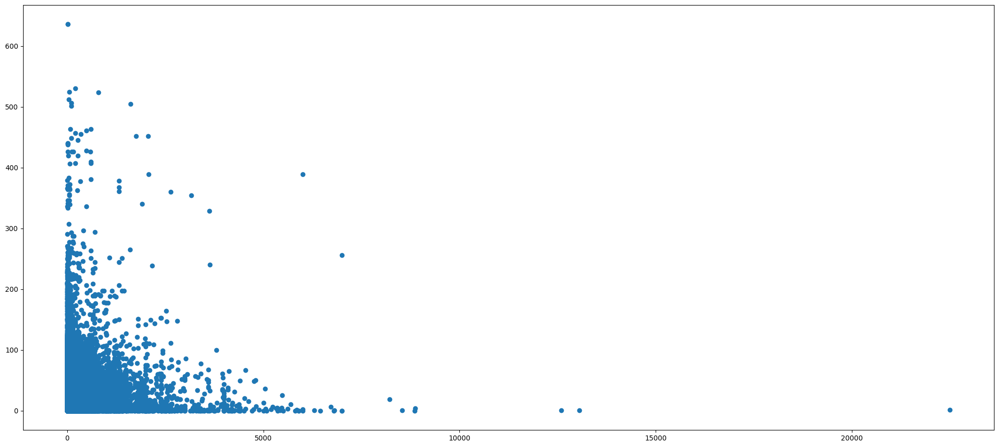

In [12]:
fig = plt.figure(figsize=(20,9))

plt.scatter(power_plants['Capacity (MW)'], power_plants['distance_to_water_km'])

plt.title("")

plt.xlabel("", fontsize=12)

plt.ylabel("", fontsize=12)

plt.tight_layout()

plt.show()

Still working on the population part, and I might not include it. I want to include it as motivation towards why I asked the question in the first place: what power plants lend themselves to what type of geographies?

In [13]:
population_df = pd.read_csv('data/population.csv', index_col=0)

In [14]:
population_sample = pd.read_csv('../final_project/data/population_sample.csv', index_col=0)

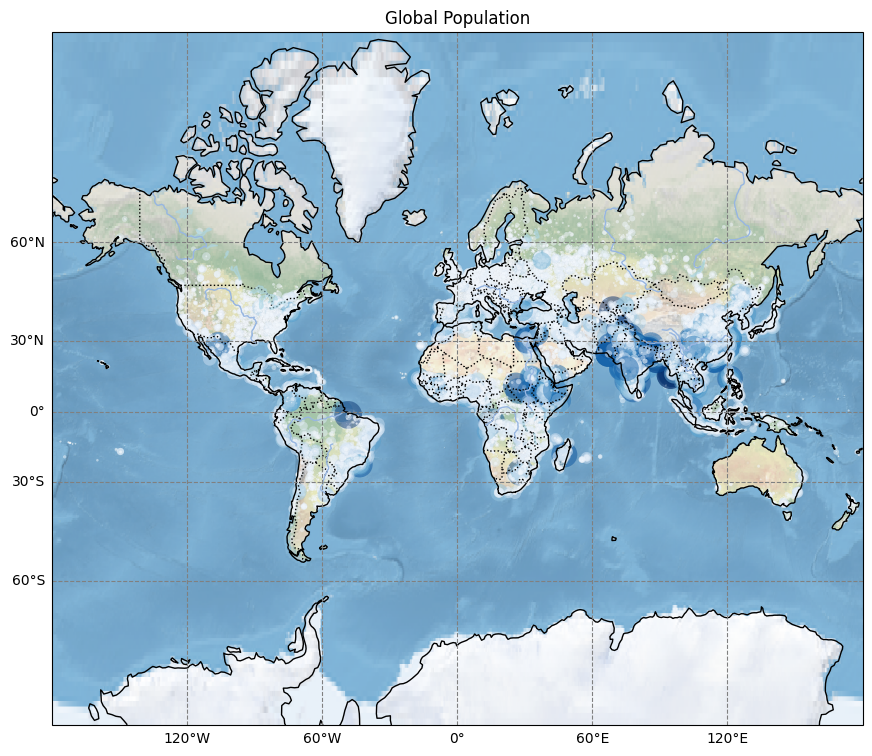

In [15]:
plot_map(f"Global Population",
             population_sample['LONG'],
             population_sample['LAT'],
             c=population_sample['population'],
             labels=None,
             cmap='Blues',
             s=population_sample['population']/100,
             edgecolor='black',
             linewidths=.005,
             alpha=0.5)

In [16]:
population_sample['Longitude'] = population_sample['LONG']

population_sample['Latitude'] = population_sample['LAT']

power_plants['LONGITUDE'] = power_plants['Longitude']

power_plants['LATITUDE'] = power_plants['Latitude']

power_plants_to_population = spatial_merge_left_join(population_sample, power_plants)

power_plants_to_population



,longitude,latitude,population,LONG,LAT,Longitude_left,Latitude_left,Powerplant Name,gppd_idnr,Capacity (MW),Primary Fuel,Owner,Source,distance_to_water_km,Longitude_right,Latitude_right,LONGITUDE,LATITUDE,distance_to_match
6776395,1.335439e+07,3.361337e+06,286.0,119.964569,28.887511,119.964569,28.887511,Yongkang Waste Incineration,WRI1071895,15.00000,Gas,NaN,UNFCCC CDM Registry,34.803292,119.8944,28.7586,119.8944,28.7586,15.828990
3674609,-1.031141e+07,4.796022e+06,1.0,-92.628931,39.517152,-92.628931,39.517152,Thomas Hill,USA0002168,1181.70000,Coal,Associated Electric Coop Inc,U.S. Energy Information Administration,39.775156,-92.6381,39.5522,-92.6381,39.5522,4.004664
7632950,4.800321e+06,1.953138e+06,193.0,43.122018,17.277380,43.122018,17.277380,JAZAN,WRI1030658,1520.90000,Oil,Saudi Electricity Company (SEC),ECRA,11.383211,42.6330,16.9400,42.6330,16.9400,65.054053
6767970,1.280401e+07,3.227888e+06,2738.0,115.020421,27.832622,115.020421,27.832622,Datang Xinyu power station,WRI1070246,440.00000,Coal,Datang International Xinyu Power Generation,GCPT,34.562016,114.9088,27.7763,114.9088,27.7763,12.672978
7040086,-1.004965e+07,3.800617e+06,335.0,-90.277534,32.283768,-90.277534,32.283768,Mississippi Baptist Medical Center,USA0054203,4.20000,Gas,Mississippi Baptist Medical,U.S. Energy Information Administration,2.298550,-90.1797,32.3133,-90.1797,32.3133,9.739563
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1232145,5.937006e+04,6.077132e+06,9.0,0.533330,47.821030,0.533330,47.821030,Thorigné-sur-Dué,WRI1025001,4.09874,Solar,NaN,Open Power System Data,69.947168,0.5199,48.0291,0.5199,48.0291,22.973525
2748225,7.563066e+05,6.248637e+06,7.0,6.794018,48.845210,6.794018,48.845210,Morhange,WRI1025475,1.44583,Solar,NaN,Open Power System Data,40.574975,6.6425,48.9277,6.6425,48.9277,14.443961
3906449,-1.083213e+07,4.386183e+06,1.0,-97.306675,36.619367,-97.306675,36.619367,Ponca,USA0000762,48.00000,Gas,Oklahoma Municipal Power Authority,U.S. Energy Information Administration,4.346192,-97.0858,36.7198,-97.0858,36.7198,22.563945
3906449,-1.083213e+07,4.386183e+06,1.0,-97.306675,36.619367,-97.306675,36.619367,Ponca City,USA0007546,134.30000,Gas,Oklahoma Municipal Power Authority,U.S. Energy Information Administration,4.346192,-97.0858,36.7198,-97.0858,36.7198,22.563945


In [17]:
power_plants_to_population['gppd_idnr'].nunique()

18591

In [18]:
power_plants['gppd_idnr'].nunique()

29910

In [63]:
mw_per_person = power_plants_to_population['Capacity (MW)'] / power_plants_to_population['population']

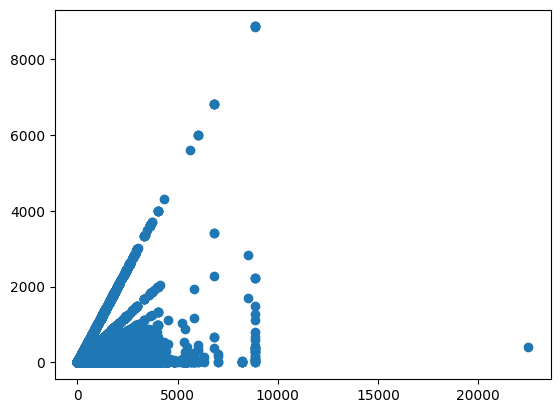

In [73]:
plt.scatter(power_plants_to_population['Capacity (MW)'], mw_per_person)

In [19]:
ncei_atmospheric_raw = pd.read_csv('data/ncei_atmospheric_raw.csv', index_col=0)

ncei_atmospheric_raw

,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,TEMP,TEMP_ATTRIBUTES,DEWP,DEWP_ATTRIBUTES,...,MAX,MAX_ATTRIBUTES,MIN,MIN_ATTRIBUTES,PRCP,PRCP_ATTRIBUTES,SNDP,FRSHTT,DATETIME,MONTH
0,99471099999,2024-01-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",55.030645,22.016129,NaN,0.000000,...,61.566129,*,50.375806,*,0.000000,I,NaN,0,2024-01-01,1
1,99471099999,2024-02-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",61.121053,21.631579,NaN,0.000000,...,67.361404,*,56.510526,*,0.000000,I,NaN,0,2024-02-01,2
2,99471099999,2024-03-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",67.901724,22.293103,NaN,0.000000,...,73.674138,*,64.208621,*,0.000000,I,NaN,0,2024-03-01,3
3,99471099999,2024-04-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",73.383333,21.783333,NaN,0.000000,...,76.908333,*,70.298333,*,0.000000,I,NaN,0,2024-04-01,4
4,99471099999,2024-05-02,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",79.854098,22.344262,NaN,0.000000,...,82.547541,*,77.262295,*,0.000000,I,NaN,0,2024-05-02,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141822,25400099999,2024-08-01,65.733333,150.90,43.0,"ZYRYANKA, RS",51.644444,7.870370,44.362963,7.870370,...,59.466667,,43.662963,,0.118333,F,NaN,0,2024-08-01,8
141823,25400099999,2024-09-01,65.733333,150.90,43.0,"ZYRYANKA, RS",41.226667,7.833333,35.790000,7.800000,...,47.376667,,35.746667,,0.074000,E,NaN,10000,2024-09-01,9
141824,25400099999,2024-10-01,65.733333,150.90,43.0,"ZYRYANKA, RS",19.525806,7.870968,13.770968,7.870968,...,23.800000,,15.229032,,0.067667,F,7.752174,0,2024-10-01,10
141825,25400099999,2024-11-01,65.733333,150.90,43.0,"ZYRYANKA, RS",-13.292308,7.923077,-19.000000,7.923077,...,-8.953846,,-17.615385,,0.011200,F,11.175000,1000,2024-11-01,11


In [20]:
full_atmospheric_w_id = ncei_atmospheric.merge(ncei_stations_id, on='NAME', how='left')

full_atmospheric_w_id

,NAME,1_TEMP,2_TEMP,3_TEMP,4_TEMP,5_TEMP,6_TEMP,7_TEMP,8_TEMP,9_TEMP,...,8_PRCP,9_PRCP,10_PRCP,11_PRCP,12_PRCP,labels,STATION,LATITUDE,LONGITUDE,ELEVATION
0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",55.030645,61.121053,67.901724,73.383333,79.854098,83.390000,82.854839,84.477778,81.543333,...,0.000000,0.000,0.000000,0.000000,0.000000,1,99471099999,27.300000,-97.420000,4.00
1,"9014098 FORT GRATIOT MI, US",24.872581,29.710714,39.132759,46.596491,55.336066,67.819643,71.725806,71.140741,66.320000,...,0.000000,0.000,0.000000,0.000000,0.000000,23,99725899999,43.010000,-82.420000,180.10
2,"9052030 OSWEGO NY, US",27.512903,30.026786,39.381034,46.408929,57.111475,67.585000,73.332258,70.574074,65.746667,...,0.000000,0.000,0.000000,0.000000,0.000000,23,99726499999,43.460000,-76.510000,78.00
3,"9063020 BUFFALO NY, US",27.285484,29.584211,37.920690,45.516667,57.940984,67.696667,73.688710,71.751852,67.973333,...,0.000000,0.000,0.000000,0.000000,0.000000,23,99725499999,42.880000,-78.890000,178.30
4,"9075014 HARBOR BEACH MI, US",24.391935,28.058929,35.505172,43.260000,51.595082,63.859322,69.646774,69.653704,65.363333,...,0.000000,0.000,0.000000,0.000000,0.000000,23,99726099999,43.850000,-82.640000,179.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12545,"ZUZ AGAC, KZ",15.324194,10.101754,31.634483,54.991379,66.526230,78.343333,78.760656,75.285185,57.006667,...,0.000000,0.000,0.000000,0.000000,0.000000,10,36619099999,47.083000,79.717000,422.00
12546,"ZVARTNOTS, AM",32.725806,35.492982,47.843103,59.543333,65.206557,76.141667,81.319355,83.433333,72.013333,...,0.000000,0.000,0.000000,0.000000,0.000000,10,35394699999,40.147275,44.395881,865.02
12547,"ZWERNDORF MARCHEGG, AU",34.679032,40.815789,46.835714,54.405000,58.822414,69.423729,71.670968,72.142593,63.316667,...,0.034074,0.223,0.056774,0.005789,0.016000,5,11085099999,48.333333,16.833333,146.00
12548,"ZYRJANOVSK, KZ",0.174194,-6.657895,15.960345,42.058621,57.152459,67.063333,67.722581,62.970370,47.553333,...,0.000000,0.000,0.000000,0.000000,0.000000,23,36421099999,49.750000,84.283000,492.00


In [21]:
ncei_atmospheric_raw['DATETIME'] = pd.to_datetime(ncei_atmospheric_raw['DATE'])

ncei_atmospheric_raw

,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,TEMP,TEMP_ATTRIBUTES,DEWP,DEWP_ATTRIBUTES,...,MAX,MAX_ATTRIBUTES,MIN,MIN_ATTRIBUTES,PRCP,PRCP_ATTRIBUTES,SNDP,FRSHTT,DATETIME,MONTH
0,99471099999,2024-01-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",55.030645,22.016129,NaN,0.000000,...,61.566129,*,50.375806,*,0.000000,I,NaN,0,2024-01-01,1
1,99471099999,2024-02-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",61.121053,21.631579,NaN,0.000000,...,67.361404,*,56.510526,*,0.000000,I,NaN,0,2024-02-01,2
2,99471099999,2024-03-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",67.901724,22.293103,NaN,0.000000,...,73.674138,*,64.208621,*,0.000000,I,NaN,0,2024-03-01,3
3,99471099999,2024-04-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",73.383333,21.783333,NaN,0.000000,...,76.908333,*,70.298333,*,0.000000,I,NaN,0,2024-04-01,4
4,99471099999,2024-05-02,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",79.854098,22.344262,NaN,0.000000,...,82.547541,*,77.262295,*,0.000000,I,NaN,0,2024-05-02,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141822,25400099999,2024-08-01,65.733333,150.90,43.0,"ZYRYANKA, RS",51.644444,7.870370,44.362963,7.870370,...,59.466667,,43.662963,,0.118333,F,NaN,0,2024-08-01,8
141823,25400099999,2024-09-01,65.733333,150.90,43.0,"ZYRYANKA, RS",41.226667,7.833333,35.790000,7.800000,...,47.376667,,35.746667,,0.074000,E,NaN,10000,2024-09-01,9
141824,25400099999,2024-10-01,65.733333,150.90,43.0,"ZYRYANKA, RS",19.525806,7.870968,13.770968,7.870968,...,23.800000,,15.229032,,0.067667,F,7.752174,0,2024-10-01,10
141825,25400099999,2024-11-01,65.733333,150.90,43.0,"ZYRYANKA, RS",-13.292308,7.923077,-19.000000,7.923077,...,-8.953846,,-17.615385,,0.011200,F,11.175000,1000,2024-11-01,11


In [22]:
ncei_atmospheric_raw['MONTH'] = ncei_atmospheric_raw['DATETIME'].dt.month

ncei_atmospheric_raw

,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,TEMP,TEMP_ATTRIBUTES,DEWP,DEWP_ATTRIBUTES,...,MAX,MAX_ATTRIBUTES,MIN,MIN_ATTRIBUTES,PRCP,PRCP_ATTRIBUTES,SNDP,FRSHTT,DATETIME,MONTH
0,99471099999,2024-01-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",55.030645,22.016129,NaN,0.000000,...,61.566129,*,50.375806,*,0.000000,I,NaN,0,2024-01-01,1
1,99471099999,2024-02-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",61.121053,21.631579,NaN,0.000000,...,67.361404,*,56.510526,*,0.000000,I,NaN,0,2024-02-01,2
2,99471099999,2024-03-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",67.901724,22.293103,NaN,0.000000,...,73.674138,*,64.208621,*,0.000000,I,NaN,0,2024-03-01,3
3,99471099999,2024-04-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",73.383333,21.783333,NaN,0.000000,...,76.908333,*,70.298333,*,0.000000,I,NaN,0,2024-04-01,4
4,99471099999,2024-05-02,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",79.854098,22.344262,NaN,0.000000,...,82.547541,*,77.262295,*,0.000000,I,NaN,0,2024-05-02,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141822,25400099999,2024-08-01,65.733333,150.90,43.0,"ZYRYANKA, RS",51.644444,7.870370,44.362963,7.870370,...,59.466667,,43.662963,,0.118333,F,NaN,0,2024-08-01,8
141823,25400099999,2024-09-01,65.733333,150.90,43.0,"ZYRYANKA, RS",41.226667,7.833333,35.790000,7.800000,...,47.376667,,35.746667,,0.074000,E,NaN,10000,2024-09-01,9
141824,25400099999,2024-10-01,65.733333,150.90,43.0,"ZYRYANKA, RS",19.525806,7.870968,13.770968,7.870968,...,23.800000,,15.229032,,0.067667,F,7.752174,0,2024-10-01,10
141825,25400099999,2024-11-01,65.733333,150.90,43.0,"ZYRYANKA, RS",-13.292308,7.923077,-19.000000,7.923077,...,-8.953846,,-17.615385,,0.011200,F,11.175000,1000,2024-11-01,11


In [23]:
ncei_atmospheric_raw[ncei_atmospheric_raw==999.9] = 999.9

ncei_atmospheric_raw[ncei_atmospheric_raw==9999.9] = 999.9

ncei_atmospheric_raw

,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,TEMP,TEMP_ATTRIBUTES,DEWP,DEWP_ATTRIBUTES,...,MAX,MAX_ATTRIBUTES,MIN,MIN_ATTRIBUTES,PRCP,PRCP_ATTRIBUTES,SNDP,FRSHTT,DATETIME,MONTH
0,99471099999,2024-01-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",55.030645,22.016129,NaN,0.000000,...,61.566129,*,50.375806,*,0.000000,I,NaN,0,2024-01-01,1
1,99471099999,2024-02-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",61.121053,21.631579,NaN,0.000000,...,67.361404,*,56.510526,*,0.000000,I,NaN,0,2024-02-01,2
2,99471099999,2024-03-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",67.901724,22.293103,NaN,0.000000,...,73.674138,*,64.208621,*,0.000000,I,NaN,0,2024-03-01,3
3,99471099999,2024-04-01,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",73.383333,21.783333,NaN,0.000000,...,76.908333,*,70.298333,*,0.000000,I,NaN,0,2024-04-01,4
4,99471099999,2024-05-02,27.300000,-97.42,4.0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",79.854098,22.344262,NaN,0.000000,...,82.547541,*,77.262295,*,0.000000,I,NaN,0,2024-05-02,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141822,25400099999,2024-08-01,65.733333,150.90,43.0,"ZYRYANKA, RS",51.644444,7.870370,44.362963,7.870370,...,59.466667,,43.662963,,0.118333,F,NaN,0,2024-08-01,8
141823,25400099999,2024-09-01,65.733333,150.90,43.0,"ZYRYANKA, RS",41.226667,7.833333,35.790000,7.800000,...,47.376667,,35.746667,,0.074000,E,NaN,10000,2024-09-01,9
141824,25400099999,2024-10-01,65.733333,150.90,43.0,"ZYRYANKA, RS",19.525806,7.870968,13.770968,7.870968,...,23.800000,,15.229032,,0.067667,F,7.752174,0,2024-10-01,10
141825,25400099999,2024-11-01,65.733333,150.90,43.0,"ZYRYANKA, RS",-13.292308,7.923077,-19.000000,7.923077,...,-8.953846,,-17.615385,,0.011200,F,11.175000,1000,2024-11-01,11


In [24]:
aggregate_function = {'STATION' : 'first',
                'DATE'    : 'first',
                'LATITUDE' : 'mean',
                'LONGITUDE' : 'mean',
                'ELEVATION' : 'mean',
                'NAME' : 'first',
                'TEMP' : 'mean',
                'TEMP_ATTRIBUTES' : 'mean',
                'DEWP' : 'mean',
                'DEWP_ATTRIBUTES' : 'mean',
                'SLP' : 'mean',
                'SLP_ATTRIBUTES' : 'mean',
                'STP' : 'mean',
                'STP_ATTRIBUTES' : 'mean',
                'VISIB' : 'mean',
                'VISIB_ATTRIBUTES' : 'mean',
                'WDSP' : 'mean',
                'WDSP_ATTRIBUTES' : 'mean',
                'MXSPD' : 'mean',
                'GUST' : 'mean',
                'MAX' : 'mean',
                'MAX_ATTRIBUTES' : 'first',
                'MIN' : 'mean',
                'MIN_ATTRIBUTES' : 'first',
                'PRCP' : 'mean',
                'PRCP_ATTRIBUTES' : 'first',
                'SNDP' : 'mean',
                'FRSHTT' : 'first',
                'DATETIME' : 'first',
                'MONTH' : 'first'}

In [25]:
ncei_atmospheric_aggregate = ncei_atmospheric_raw.groupby(['NAME', 'MONTH']).agg(aggregate_function)
#data quality issue
ncei_atmospheric_aggregate = ncei_atmospheric_aggregate.fillna(0)

ncei_atmospheric_aggregate

STATION        DATE  \
NAME                                    MONTH                            
068 BAFFIN BAY POINT OF ROCKS TX, TX US 1      99471099999  2024-01-01   
                                        2      99471099999  2024-02-01   
                                        3      99471099999  2024-03-01   
                                        4      99471099999  2024-04-01   
                                        5      99471099999  2024-05-02   
...                                                    ...         ...   
ZYRYANKA, RS                            8      25400099999  2024-08-01   
                                        9      25400099999  2024-09-01   
                                        10     25400099999  2024-10-01   
                                        11     25400099999  2024-11-01   
                                        12     25400099999  2024-12-02   

                                                LATITUDE  LONGITUDE  \
NAME                                    MONTH                         
068 BAFFIN BAY POINT OF ROCKS TX, TX US 1      27.300000     -97.42   
                                        2      27.300000     -97.42   
                                        3      27.300000     -97.42   
                                        4      27.300000     -97.42   
                                        5      27.300000     -97.42   
...                                                  ...        ...   
ZYRYANKA, RS                            8      65.733333     150.90   
                                        9      65.733333     150.90   
                                        10     65.733333     150.90   
                                        11     65.733333     150.90   
                                        12     65.733333     150.90   

                                               ELEVATION  \
NAME                                    MONTH              
068 BAFFIN BAY POINT OF ROCKS TX, TX US 1            4.0   
                                        2            4.0   
                                        3            4.0   
                                        4            4.0   
                                        5            4.0   
...                                                  ...   
ZYRYANKA, RS                            8           43.0   
                                        9           43.0   
                                        10          43.0   
                                        11          43.0   
                                        12          43.0   

                                                                                  NAME  \
NAME                                    MONTH                                            
068 BAFFIN BAY POINT OF ROCKS TX, TX US 1      068 BAFFIN BAY POINT OF ROCKS TX, TX US   
                                        2      068 BAFFIN BAY POINT OF ROCKS TX, TX US   
                                        3      068 BAFFIN BAY POINT OF ROCKS TX, TX US   
                                        4      068 BAFFIN BAY POINT OF ROCKS TX, TX US   
                                        5      068 BAFFIN BAY POINT OF ROCKS TX, TX US   
...                                                                                ...   
ZYRYANKA, RS                            8                                 ZYRYANKA, RS   
                                        9                                 ZYRYANKA, RS   
                                        10                                ZYRYANKA, RS   
                                        11                                ZYRYANKA, RS   
                                        12                                ZYRYANKA, RS   

                                                    TEMP  TEMP_ATTRIBUTES  \
NAME                                    MONTH                               
068 BAFFIN BAY POINT OF ROCKS TX, TX US 1      55.030645  

<h4>Temperature</h4>
The rainforest biome remains warm all year and must stay frost-free. The average daily temperatures range from 20°C (68°F) to 25°C (77°F).

<h4>Precipitation</h4>
Rainforests receive the most rain of all of the biomes in a year! A typical year sees 2,000 to 10,000 millimeters (79 to 394 inches) of rain per year.

https://earthobservatory.nasa.gov/biome/biorainforest.php

In [26]:
ncei_atmospheric_temp_precip = ncei_atmospheric_aggregate.groupby(level='NAME').agg(
    Min_Temp_F=('TEMP', 'min'),
    Min_Precip_In=('PRCP', 'min')
)

ncei_atmospheric_temp_precip

,Min_Temp_F,Min_Precip_In
NAME,,
"068 BAFFIN BAY POINT OF ROCKS TX, TX US",55.030645,0.000000
"9014098 FORT GRATIOT MI, US",24.872581,0.000000
"9052030 OSWEGO NY, US",27.512903,0.000000
"9063020 BUFFALO NY, US",27.285484,0.000000
"9075014 HARBOR BEACH MI, US",24.391935,0.000000
...,...,...
"ZUZ AGAC, KZ",10.101754,0.000000
"ZVARTNOTS, AM",32.725806,0.000000
"ZWERNDORF MARCHEGG, AU",34.679032,0.005789


In [27]:
tropical_rainforest_temperature = (ncei_atmospheric_temp_precip['Min_Precip_In'] > 0.079)

tropical_rainforest_precipitation = (ncei_atmospheric_temp_precip['Min_Temp_F'] > 68)

tropical_rainforests_df = ncei_atmospheric_temp_precip[tropical_rainforest_temperature &
                                                       tropical_rainforest_precipitation]

tropical_rainforests_df

,Min_Temp_F,Min_Precip_In
NAME,,
"APIA UPOLU ISLAND, WS",79.579630,0.090185
"AUKI, BP",79.956250,0.154643
"BABELTHUAP KOROR AIRPORT, PW PS",81.059649,0.226780
"BAHIR DAR, ET",69.900000,0.120000
"BALER RADAR, RP",75.838710,0.116885
...,...,...
"VAL DE CANS JULIO CEZAR RIBEIRO INTERNATIONAL, BR",79.160714,0.210323
"YAGOUA CITY, CM",78.766667,0.143333
"YALINGA, CT",76.600000,1.340000


In [28]:
ncei_atmospheric_aggregate.reset_index(drop=True,inplace=True)

In [29]:
tropical_rainforests_df = tropical_rainforests_df.merge(ncei_atmospheric_aggregate.groupby('NAME').head(1),
                                                        on='NAME',
                                                        how='inner')

tropical_rainforests_df

,NAME,Min_Temp_F,Min_Precip_In,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,TEMP,TEMP_ATTRIBUTES,...,MAX,MAX_ATTRIBUTES,MIN,MIN_ATTRIBUTES,PRCP,PRCP_ATTRIBUTES,SNDP,FRSHTT,DATETIME,MONTH
0,"APIA UPOLU ISLAND, WS",79.579630,0.090185,91762099999,2024-01-01,-13.800000,-171.783333,2.00,81.937097,7.629032,...,87.283871,,76.238710,,0.642419,G,0.0,0,2024-01-01,1
1,"AUKI, BP",79.956250,0.154643,91507099999,2024-01-05,-8.783333,160.733333,11.00,82.355102,5.448980,...,86.693878,*,78.446939,*,0.700204,G,0.0,10000,2024-01-05,1
2,"BABELTHUAP KOROR AIRPORT, PW PS",81.059649,0.226780,91408040310,2024-01-01,7.367220,134.544170,53.60,81.519355,24.000000,...,86.909677,,76.337097,,0.401639,G,0.0,0,2024-01-01,1
3,"BAHIR DAR, ET",69.900000,0.120000,63332099999,2024-07-17,11.608075,37.321644,1822.09,69.900000,4.666667,...,75.933333,*,59.300000,,0.210000,G,0.0,0,2024-07-17,7
4,"BALER RADAR, RP",75.838710,0.116885,98334099999,2024-01-01,15.750000,121.633333,178.00,75.838710,7.838710,...,83.019355,,70.937097,,0.116885,A,0.0,0,2024-01-01,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111,"VAL DE CANS JULIO CEZAR RIBEIRO INTERNATIONAL, BR",79.160714,0.210323,82193099999,2025-01-01,-1.379250,-48.476292,16.45,79.812903,23.935484,...,87.448387,*,75.319355,*,0.252105,H,0.0,10000,2025-01-01,1
112,"YAGOUA CITY, CM",78.766667,0.143333,64851499999,2024-09-07,10.367000,15.233000,326.00,78.766667,4.000000,...,89.466667,,74.083333,,0.143333,G,0.0,0,2024-09-07,9
113,"YALINGA, CT",76.600000,1.340000,64661099999,2025-03-08,6.500000,23.266667,602.00,76.600000,4.000000,...,80.100000,,72.500000,,1.340000,E,0.0,10,2025-03-08,3
114,"YAP ISLAND WEATHER SERVICE OFFICE AIRPORT, FM FM",81.756667,0.094677,91413040308,2024-01-01,9.483330,138.083330,13.40,82.251613,23.693548,...,87.196774,*,78.122581,,0.128387,G,0.0,10000,2024-01-01,1


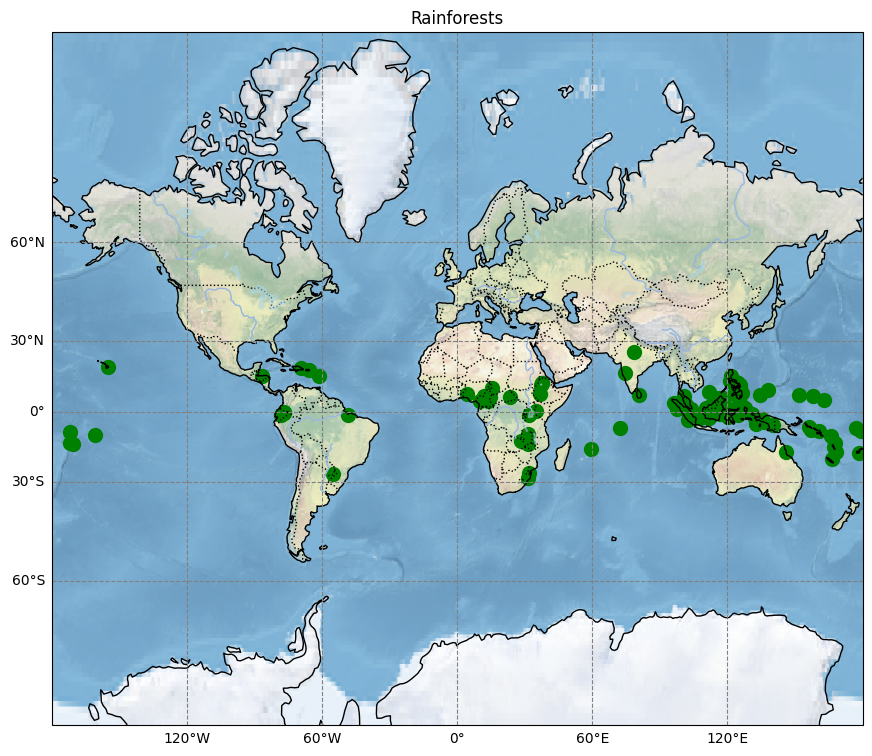

In [30]:
plot_map('Rainforests',
         tropical_rainforests_df['LONGITUDE'],
         tropical_rainforests_df['LATITUDE'],
         c='green',
         labels=None,
         cmap=False,
         s=100)

<center><h4>NASA Rainforest Map</h4></center>
<img src='data/nasa-map-rainforest.jpg'></img>

<h3>Step 2: Unsupervised Feature Discovery</h3>

Use unsupervised learning to discover features that will improve your predictions. You must complete ONE of these (you may do both if you wish, but must fully complete at least one):

<h4>Option A: Clustering</h4>
Try at least 3-4 different values of k (e.g., k=2, 3, 4, 5) and use the elbow method or silhouette scores to select the optimal number<br>
Use the elbow method or silhouette scores to help decide<br>
Minimum 4 visualizations required:<br>

[x]Elbow plot or silhouette plot<br>
[x]Scatter plot showing your final clusters (color-coded)<br>
[x]At least 2 additional visualizations comparing clusters (box plots, bar charts, heatmaps showing cluster characteristics)<br>
[ ]Describe each cluster: What makes this group different? Give them meaningful names that reflect their characteristics. Think ahead: How might cluster membership help you predict your target variable in Phase 2?<br>

Examples of good cluster names:<br>

✅ "Budget-conscious families" (not "Cluster 1")<br>
✅ "Premium business travelers" (not "High-value customers")<br>
✅ "Occasional weekend shoppers" (not "Low-frequency segment")<br>
Examples of poor cluster names:<br>

❌ "Cluster 1", "Cluster 2"<br>
❌ "High-value customers" (too generic)<br>
❌ "Group A" (not descriptive)<br>

Critical Requirement: You must explain what you discovered in words a non-technical person would understand. What hidden groups or patterns exist in your data? Most importantly: How will these discoveries help you make better predictions?<br>

Important Note: If your initial unsupervised analysis doesn't reveal clear patterns, document this! Try different preprocessing (scaling, feature selection) or different methods. Sometimes discovering "no clear patterns" is valuable learning. Explain why patterns might not exist in your data and what this means for your predictive models.<br>

In [31]:
# --- 1. Pivot the 'TEMP' column ---
temp_pivot = ncei_atmospheric_aggregate.pivot_table(
    index='NAME',       # The row labels will be the station names
    columns='MONTH',    # The new columns will be the month numbers (1-12)
    values='TEMP',      # The data to fill the cells will come from the 'TEMP' column
    aggfunc='mean'      # If a station has multiple entries for a month, take the average
)

temp_pivot.columns = [str(i)+'_TEMP' for i in range(1,13)]

print("Temperature Pivot Table:")
print(temp_pivot.head())

# --- 2. Pivot the 'PRCP' column ---
precip_pivot = ncei_atmospheric_aggregate.pivot_table(
    index='NAME',       # Row labels
    columns='MONTH',    # Column labels (1-12)
    values='PRCP',      # Data to fill cells
    aggfunc='mean'       # Typically aggregate precipitation by summing the month's total
)

precip_pivot.columns = [str(i)+'_PRCP' for i in range(1,13)]

print("\nPrecipitation Pivot Table:")
print(precip_pivot.head())


Temperature Pivot Table:
                                            1_TEMP     2_TEMP     3_TEMP  \
NAME                                                                       
068 BAFFIN BAY POINT OF ROCKS TX, TX US  55.030645  61.121053  67.901724   
9014098 FORT GRATIOT MI, US              24.872581  29.710714  39.132759   
9052030 OSWEGO NY, US                    27.512903  30.026786  39.381034   
9063020 BUFFALO NY, US                   27.285484  29.584211  37.920690   
9075014 HARBOR BEACH MI, US              24.391935  28.058929  35.505172   

                                            4_TEMP     5_TEMP     6_TEMP  \
NAME                                                                       
068 BAFFIN BAY POINT OF ROCKS TX, TX US  73.383333  79.854098  83.390000   
9014098 FORT GRATIOT MI, US              46.596491  55.336066  67.819643   
9052030 OSWEGO NY, US                    46.408929  57.111475  67.585000   
9063020 BUFFALO NY, US                   45.516667  57.940984 

In [32]:
# data quality issue
monthly_pivot = pd.concat([temp_pivot, 
                           precip_pivot], axis=1)
# data quality issue
monthly_pivot = monthly_pivot[~np.isnan(monthly_pivot).any(axis=1)]

monthly_pivot

,1_TEMP,2_TEMP,3_TEMP,4_TEMP,5_TEMP,6_TEMP,7_TEMP,8_TEMP,9_TEMP,10_TEMP,...,3_PRCP,4_PRCP,5_PRCP,6_PRCP,7_PRCP,8_PRCP,9_PRCP,10_PRCP,11_PRCP,12_PRCP
NAME,,,,,,,,,,,,,,,,,,,,,
"068 BAFFIN BAY POINT OF ROCKS TX, TX US",55.030645,61.121053,67.901724,73.383333,79.854098,83.390000,82.854839,84.477778,81.543333,78.416129,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000
"9014098 FORT GRATIOT MI, US",24.872581,29.710714,39.132759,46.596491,55.336066,67.819643,71.725806,71.140741,66.320000,55.554839,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000
"9052030 OSWEGO NY, US",27.512903,30.026786,39.381034,46.408929,57.111475,67.585000,73.332258,70.574074,65.746667,55.070968,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000
"9063020 BUFFALO NY, US",27.285484,29.584211,37.920690,45.516667,57.940984,67.696667,73.688710,71.751852,67.973333,55.941935,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000
"9075014 HARBOR BEACH MI, US",24.391935,28.058929,35.505172,43.260000,51.595082,63.859322,69.646774,69.653704,65.363333,56.019355,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"ZUZ AGAC, KZ",15.324194,10.101754,31.634483,54.991379,66.526230,78.343333,78.760656,75.285185,57.006667,47.693548,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000
"ZVARTNOTS, AM",32.725806,35.492982,47.843103,59.543333,65.206557,76.141667,81.319355,83.433333,72.013333,55.758065,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000
"ZWERNDORF MARCHEGG, AU",34.679032,40.815789,46.835714,54.405000,58.822414,69.423729,71.670968,72.142593,63.316667,53.529032,...,0.044286,0.04400,0.041207,0.067966,0.054194,0.034074,0.223,0.056774,0.005789,0.016000


In [33]:
k_range = range(1, 3)

wcss = []

for n_clusters in k_range:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    kmeans.fit(monthly_pivot)
    wcss.append(kmeans.inertia_)
    
silhouette_scores = []

k_range_silhouette = range(2, 3)

for n_clusters in k_range_silhouette:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    
    cluster_labels = kmeans.fit_predict(monthly_pivot)
    
    score = silhouette_score(monthly_pivot, cluster_labels)
    
    silhouette_scores.append(score)

In [34]:
X = monthly_pivot

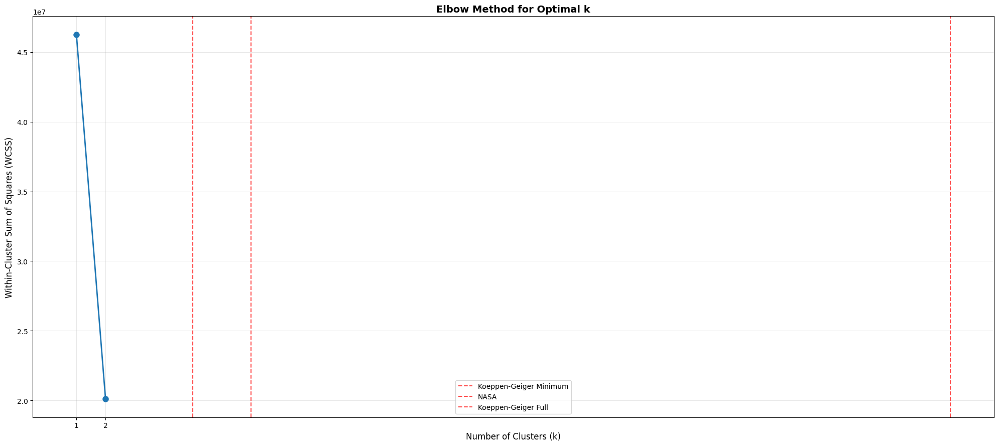

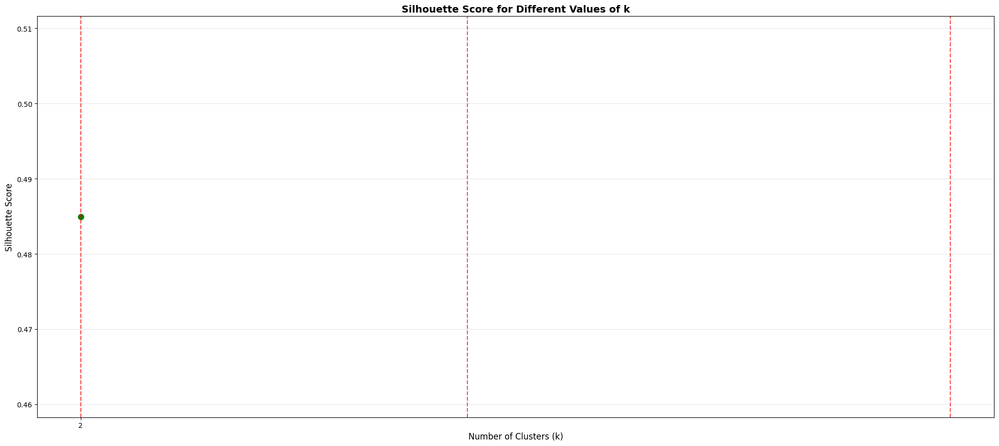

In [35]:
plt.figure(figsize=(20, 9))

plt.plot(k_range, wcss, marker='o', linewidth=2, markersize=8)

plt.xlabel('Number of Clusters (k)', fontsize=12)

plt.ylabel('Within-Cluster Sum of Squares (WCSS)', fontsize=12)

plt.title('Elbow Method for Optimal k', fontsize=14, fontweight='bold')

plt.grid(True, alpha=0.3)

plt.xticks(k_range)

plt.axvline(x=5, color='red', linestyle='--', alpha=0.7, label='Koeppen-Geiger Minimum')

plt.axvline(x=7, color='red', linestyle='--', alpha=0.7, label='NASA')

plt.axvline(x=31, color='red', linestyle='--', alpha=0.7, label='Koeppen-Geiger Full')

plt.legend()

plt.tight_layout()

plt.show()

plt.figure(figsize=(20, 9))

plt.grid(True, alpha=0.3)

plt.plot(k_range_silhouette, silhouette_scores, marker='o', linewidth=2, markersize=8, color='green')

plt.xlabel('Number of Clusters (k)', fontsize=12)

plt.ylabel('Silhouette Score', fontsize=12)

plt.title('Silhouette Score for Different Values of k', fontsize=14, fontweight='bold')

plt.grid(True, alpha=0.3)

plt.xticks(k_range_silhouette)

plt.axvline(x=2, color='red', linestyle='--', alpha=0.7)

plt.axvline(x=6, color='red', linestyle='--', alpha=0.7)

plt.axvline(x=11, color='red', linestyle='--', alpha=0.7)

plt.tight_layout()

plt.show()

The elbow method doesn't show a clear line of diminishing returns. The existing Koeppen-Geiger climate classification has 5 main classifications with several subclassifications in each. The NASA map has 7 classifications.<br>

The silhouette score gives a better set of n_clusters=k. 

(write a blurb about Koeppen-Geiger classification system.)

In [36]:
k_values = [2, 5, 11]

<img src='data/map-koeppen-geiger-globe.jpg'></img>

/var/folders/gl/919514x5085c7h3zzn_f471w0000gp/T/ipykernel_62349/1154320571.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(cmap_name, num_categories)


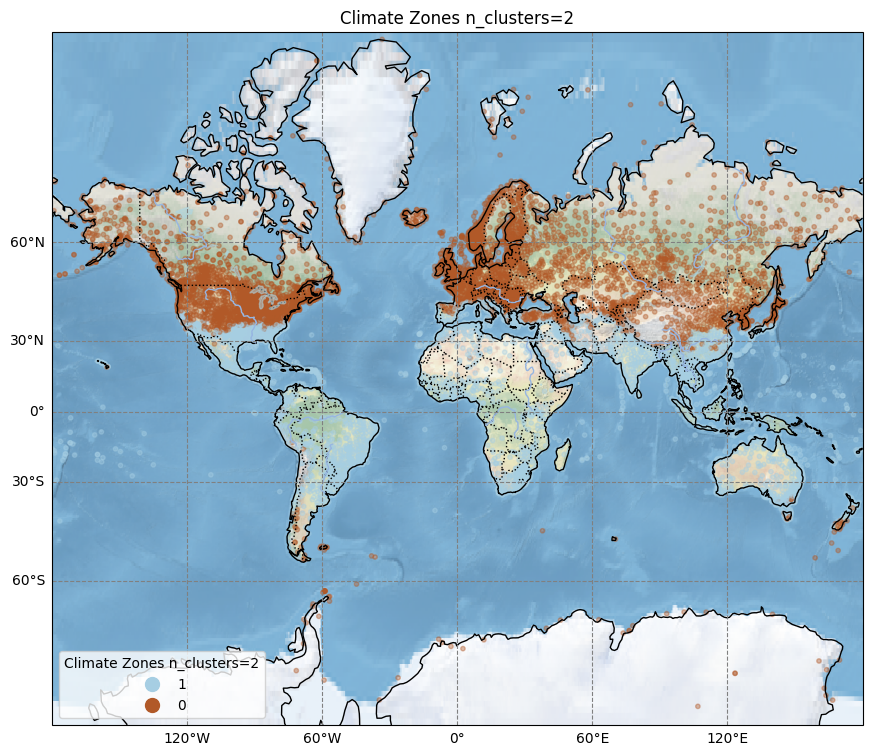

/var/folders/gl/919514x5085c7h3zzn_f471w0000gp/T/ipykernel_62349/1154320571.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(cmap_name, num_categories)


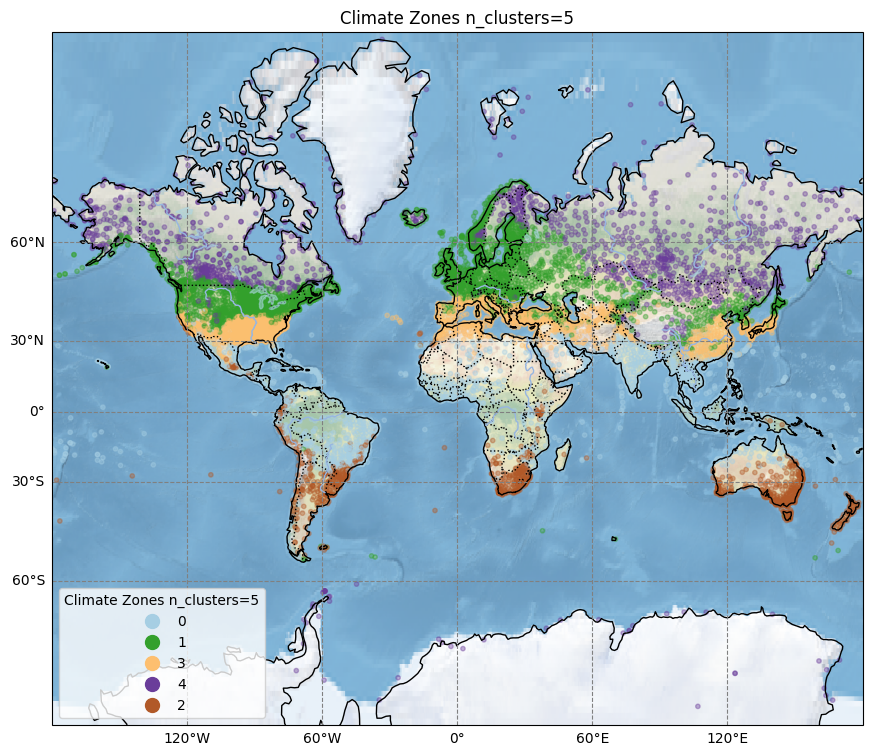

/var/folders/gl/919514x5085c7h3zzn_f471w0000gp/T/ipykernel_62349/1154320571.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(cmap_name, num_categories)


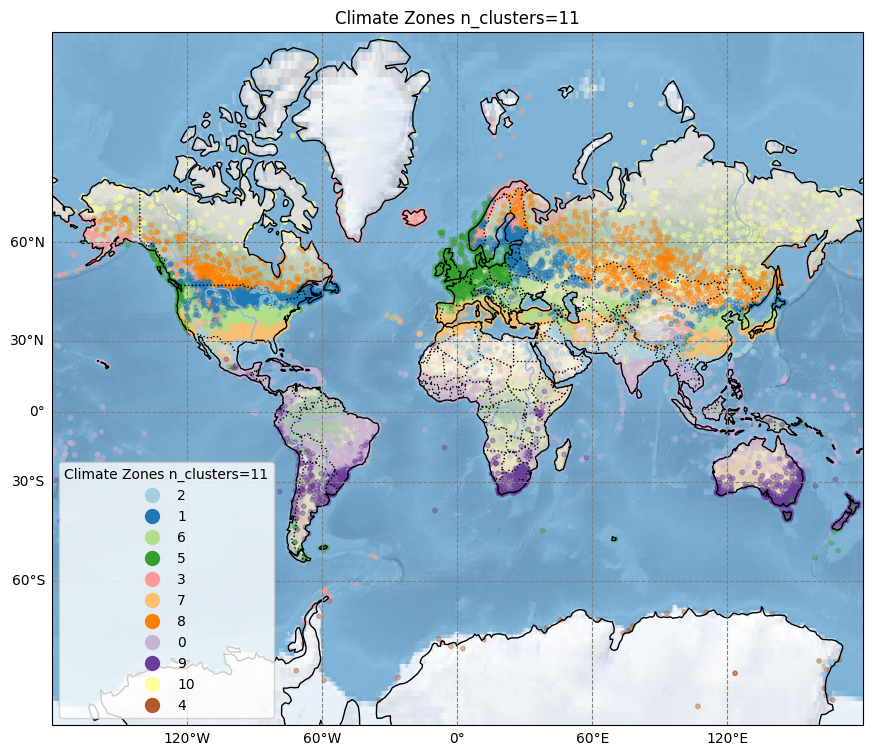

In [37]:
X = monthly_pivot.copy()

for n_clusters in k_values: 
    kmeans_3d_pred = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)

    labels_k = kmeans_3d_pred.fit_predict(X)

    monthly_pivot[f"CLIMATE ZONE n_clusters={n_clusters}"] = labels_k
    
    monthly_pivot_w_stations = monthly_pivot.merge(ncei_stations_id[['LONGITUDE','LATITUDE','NAME']],
                                                   on='NAME',
                                                   how='left')

    monthly_pivot_w_stations = monthly_pivot_w_stations.dropna()

    levels, categories = pd.factorize(monthly_pivot_w_stations[f"CLIMATE ZONE n_clusters={n_clusters}"])

    num_categories = len(categories)

    cmap_name = 'Paired'

    cmap = plt.cm.get_cmap(cmap_name, num_categories)

    plot_map(f"Climate Zones n_clusters={n_clusters}",
             monthly_pivot_w_stations['LONGITUDE'],
             monthly_pivot_w_stations['LATITUDE'],
             c=levels,
             labels=monthly_pivot_w_stations[f"CLIMATE ZONE n_clusters={n_clusters}"],
             cmap=cmap,
             s=10,
             alpha=0.4)

<center>NASA Biomes Map</center>
<img src='data/map-nasa-biomes.png'></img>
<img src='data/labels-nasa-biome.png'></img>

/var/folders/gl/919514x5085c7h3zzn_f471w0000gp/T/ipykernel_62349/3345726554.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(cmap_name, num_categories)


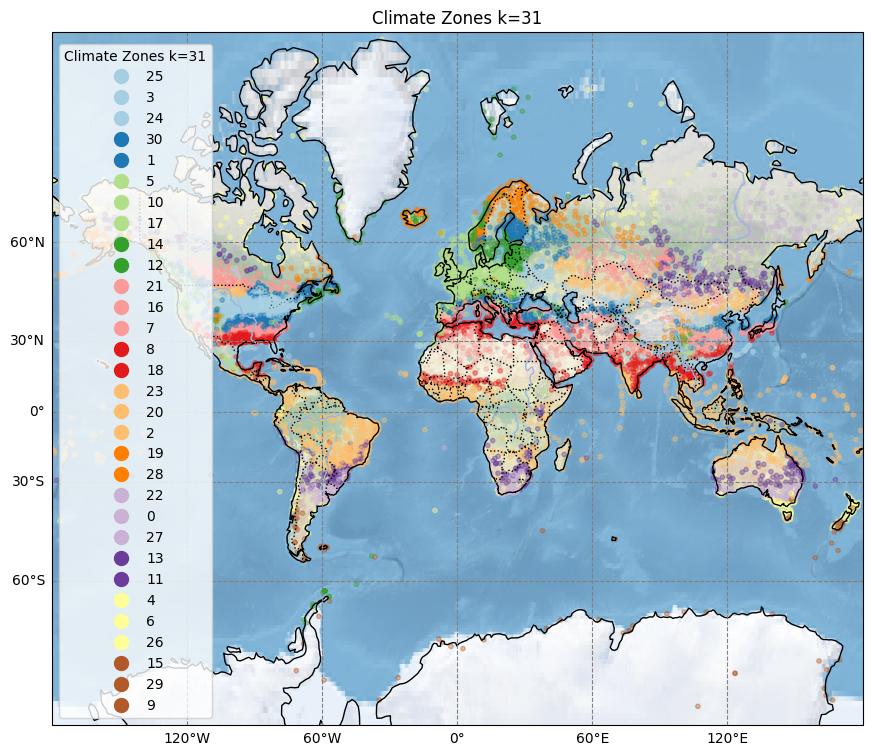

In [38]:
n_clusters = 31

kmeans_3d_pred = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)

labels_k = kmeans_3d_pred.fit_predict(monthly_pivot)

monthly_pivot[f"CLIMATE ZONE n_clusters={n_clusters}"] = labels_k

monthly_full_df = monthly_pivot.merge(ncei_atmospheric_aggregate.groupby('NAME').head(1), on='NAME', how='inner')

levels, categories = pd.factorize(monthly_full_df[f"CLIMATE ZONE n_clusters={n_clusters}"])

num_categories = len(categories)

cmap_name = 'Paired'

cmap = plt.cm.get_cmap(cmap_name, num_categories)

plot_map(f"Climate Zones k={n_clusters}",
         monthly_full_df['LONGITUDE'],
         monthly_full_df['LATITUDE'],
         c=levels,
         labels=monthly_full_df[f"CLIMATE ZONE n_clusters={n_clusters}"],
         cmap=cmap,
         s=10,
         alpha=0.4)

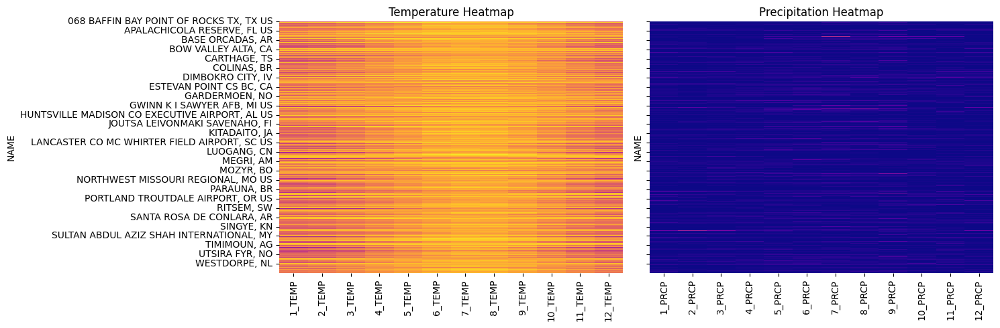

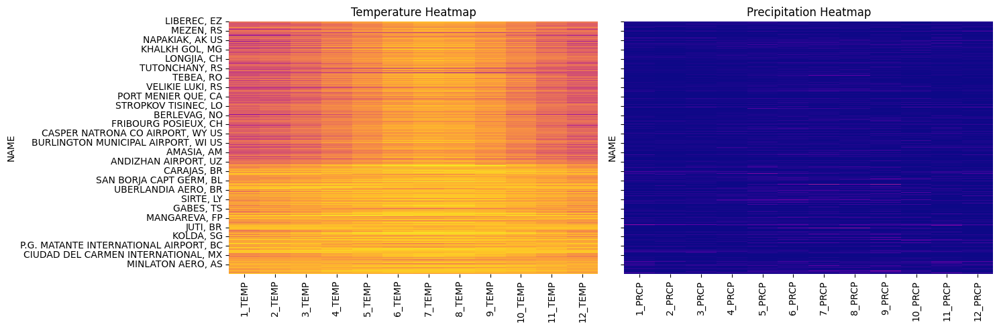

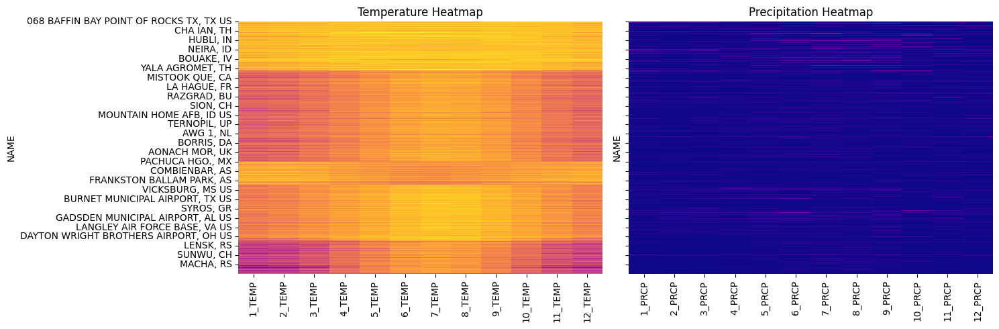

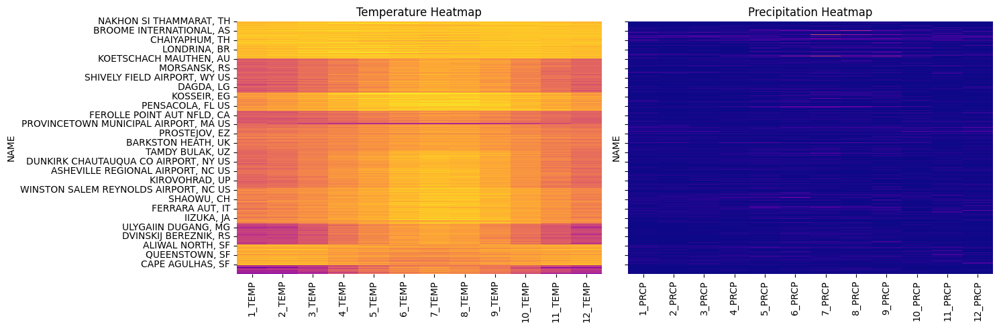

In [39]:
fig, _maps = plt.subplots(nrows=1, ncols=2, figsize=(15, 5), sharey=True)

cmaps = ['plasma', 'plasma']

pivot_tables = {'Temperature' : temp_pivot,
                'Precipitation' : precip_pivot}

for index, (key, value) in enumerate(pivot_tables.items()):
    sns.heatmap(data=monthly_pivot[value.columns],
                ax=_maps[index],
                cmap=cmaps[index],
                cbar=False,
                annot=False,
                fmt=".1f"
    )

    _maps[index].set_title(f'{key} Heatmap')
  
plt.tight_layout()

plt.show()

for n_clusters in k_values:
    fig, _maps = plt.subplots(nrows=1, ncols=2, figsize=(15, 5), sharey=True)

    for index, (key, value) in enumerate(pivot_tables.items()):
        sns.heatmap(data=monthly_pivot.sort_values(f"CLIMATE ZONE n_clusters={n_clusters}")[value.columns],
                    ax=_maps[index],
                    cmap=cmaps[index],
                    cbar=False,
                    annot=False,
                    fmt=".1f"
        )

        _maps[index].set_title(f'{key} Heatmap')

    plt.tight_layout()

    plt.show()



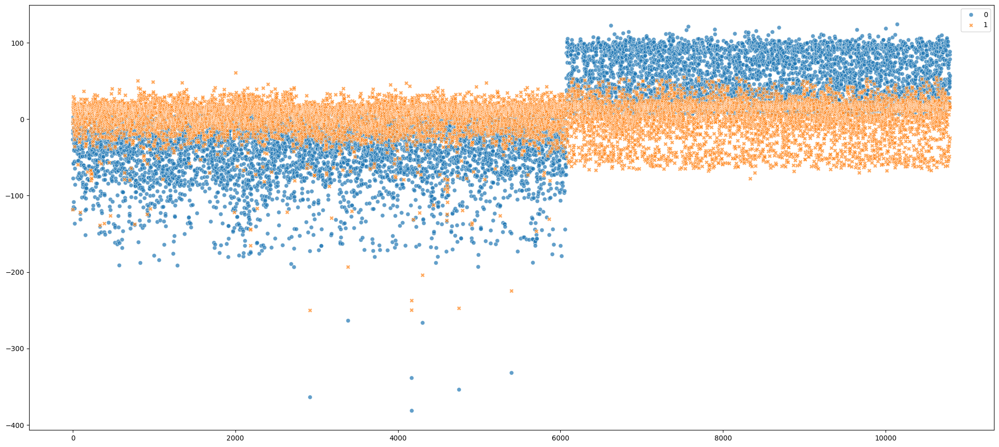

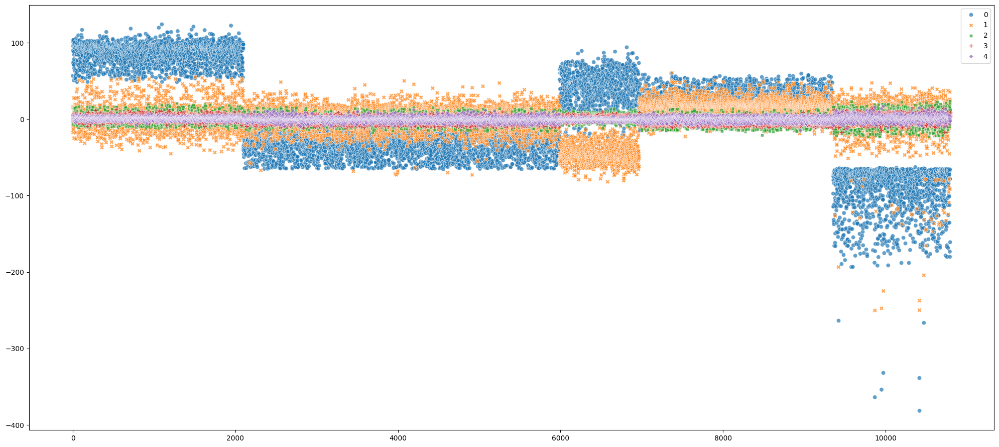

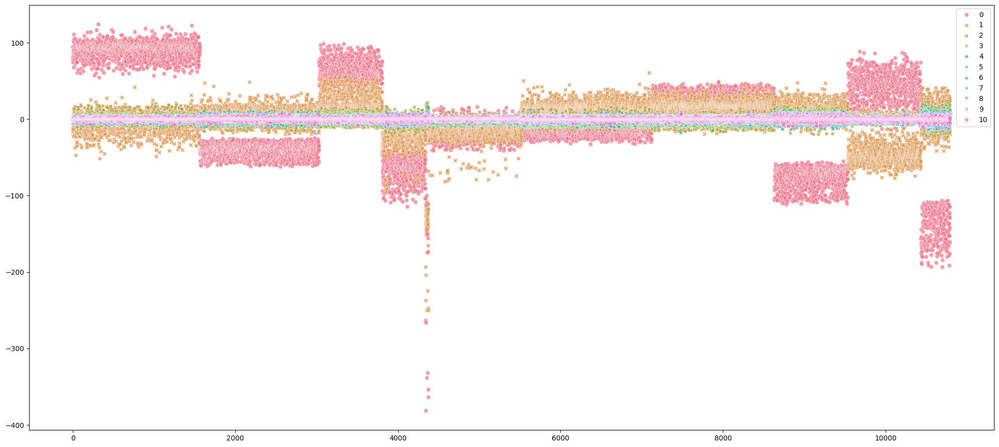

In [40]:
for n_clusters in k_values:
    pca_full = PCA(n_components=n_clusters, random_state=42)

    X_pca_full = pca_full.fit_transform(monthly_pivot.sort_values(f"CLIMATE ZONE n_clusters={n_clusters}")[temp_pivot.columns])

    fig = plt.figure(figsize=(20, 9))

    sns.scatterplot(
        data=X_pca_full,
        alpha=0.7
    )

    plt.tight_layout()

    plt.show()

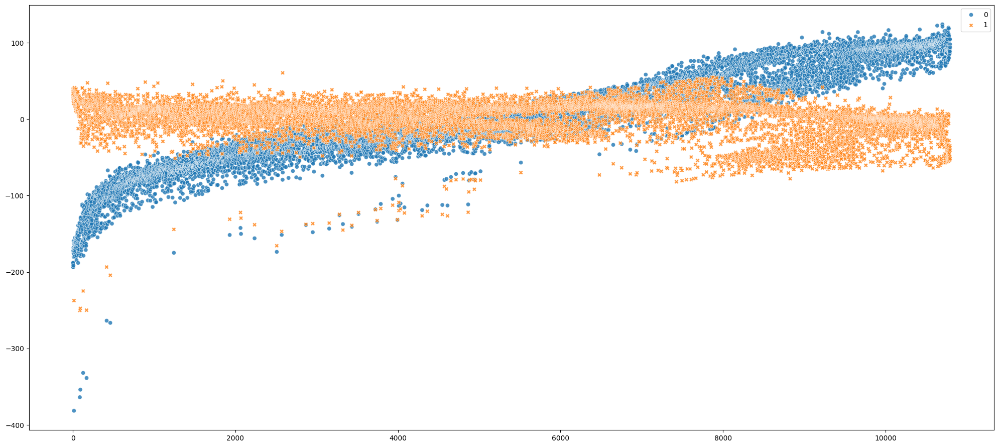

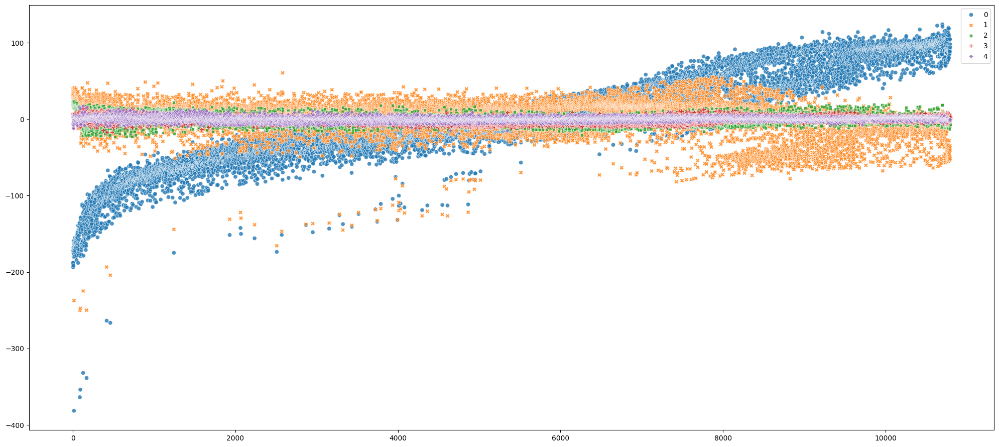

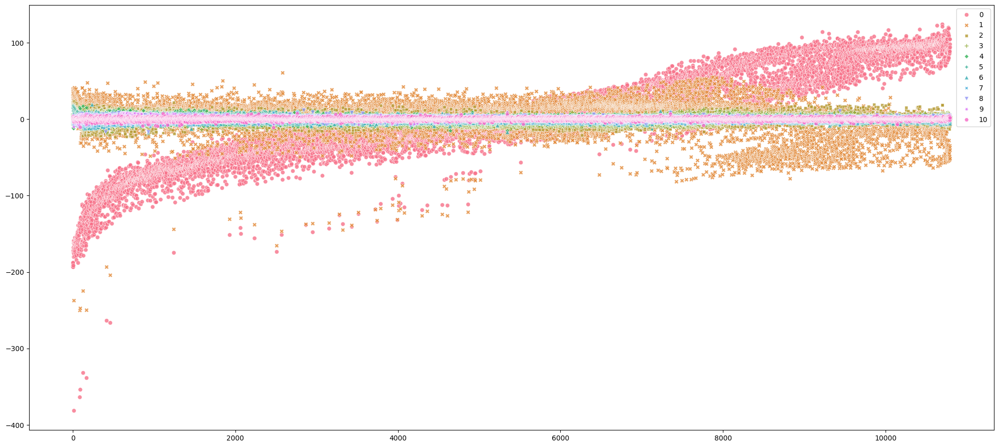

In [41]:
for n_clusters in k_values:
    pca_full = PCA(n_components=n_clusters, random_state=42)

    sort_order = list(temp_pivot.columns) + [f"CLIMATE ZONE n_clusters={n_clusters}"]

    sorted_pivot = monthly_pivot.sort_values(by=sort_order)

    X_pca_full = pca_full.fit_transform(sorted_pivot[temp_pivot.columns])
    
    fig = plt.figure(figsize=(20, 9))

    sns.scatterplot(
        data=X_pca_full,
        alpha=0.8
    )

    plt.tight_layout()

    plt.show()

I'm actually unsure of exactly what I'm looking at with the PCA. Here's my interpretation: the y-axis represents temperature, as the largest source of variance, and the x-axis represents the individual stations. The first PCA plot gives a clue, if you look at the map of k=2, it looks like the clusters are Northern Hemisphere and Southern Hemisphere. For half of the year, either hemipshere will be opposite the other, so I'm assuming there is a time component in the x-axis. I want to use these PCA plots to describe Climate Zones, I just don't have sufficient knowledge of what the components are or how to analyze them.<br>

Looks like there are climate zones that are relatively stable across the entire year, and then climate zones that vary. How can I use these plots to describe climate zones.<br>

How would the second set of plots be arranged back into a cyclical nature?

<h3>Step 3: Integrate Discovered Features into Predictive Models</h3>

Take the features you discovered in Phase 1 (cluster memberships, principal components, or derived features) and integrate them into your predictive models. You have options:

If you did clustering:

[x]Add cluster membership as a new feature in your prediction models.<br>
OR[ ]predict within each cluster separately.<br>
OR[ ]use clusters to create new engineered features (e.g., "distance from cluster center").<br>


In [42]:
monthly_pivot_w_stations = monthly_pivot.merge(ncei_stations_id, on='NAME', how='left')

# data quality issue
monthly_pivot_w_stations = monthly_pivot_w_stations.dropna()

monthly_pivot_w_stations

,NAME,1_TEMP,2_TEMP,3_TEMP,4_TEMP,5_TEMP,6_TEMP,7_TEMP,8_TEMP,9_TEMP,...,11_PRCP,12_PRCP,CLIMATE ZONE n_clusters=2,CLIMATE ZONE n_clusters=5,CLIMATE ZONE n_clusters=11,CLIMATE ZONE n_clusters=31,STATION,LATITUDE,LONGITUDE,ELEVATION
0,"068 BAFFIN BAY POINT OF ROCKS TX, TX US",55.030645,61.121053,67.901724,73.383333,79.854098,83.390000,82.854839,84.477778,81.543333,...,0.000000,0.000000,1,0,2,25,99471099999,27.300000,-97.420000,4.00
1,"9014098 FORT GRATIOT MI, US",24.872581,29.710714,39.132759,46.596491,55.336066,67.819643,71.725806,71.140741,66.320000,...,0.000000,0.000000,0,1,1,3,99725899999,43.010000,-82.420000,180.10
2,"9052030 OSWEGO NY, US",27.512903,30.026786,39.381034,46.408929,57.111475,67.585000,73.332258,70.574074,65.746667,...,0.000000,0.000000,0,1,1,3,99726499999,43.460000,-76.510000,78.00
3,"9063020 BUFFALO NY, US",27.285484,29.584211,37.920690,45.516667,57.940984,67.696667,73.688710,71.751852,67.973333,...,0.000000,0.000000,0,1,6,24,99725499999,42.880000,-78.890000,178.30
4,"9075014 HARBOR BEACH MI, US",24.391935,28.058929,35.505172,43.260000,51.595082,63.859322,69.646774,69.653704,65.363333,...,0.000000,0.000000,0,1,1,3,99726099999,43.850000,-82.640000,179.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10790,"ZUZ AGAC, KZ",15.324194,10.101754,31.634483,54.991379,66.526230,78.343333,78.760656,75.285185,57.006667,...,0.000000,0.000000,0,1,1,23,36619099999,47.083000,79.717000,422.00
10791,"ZVARTNOTS, AM",32.725806,35.492982,47.843103,59.543333,65.206557,76.141667,81.319355,83.433333,72.013333,...,0.000000,0.000000,0,3,6,1,35394699999,40.147275,44.395881,865.02
10792,"ZWERNDORF MARCHEGG, AU",34.679032,40.815789,46.835714,54.405000,58.822414,69.423729,71.670968,72.142593,63.316667,...,0.005789,0.016000,0,1,6,17,11085099999,48.333333,16.833333,146.00
10793,"ZYRJANOVSK, KZ",0.174194,-6.657895,15.960345,42.058621,57.152459,67.063333,67.722581,62.970370,47.553333,...,0.000000,0.000000,0,4,8,13,36421099999,49.750000,84.283000,492.00


In [43]:
merged_df = spatial_merge_left_join(power_plants, monthly_pivot_w_stations)

merged_df = merged_df.groupby('gppd_idnr').first()

merged_df

,Powerplant Name,Capacity (MW),Primary Fuel,Owner,Source,distance_to_water_km,Longitude,Latitude,LONGITUDE_left,LATITUDE_left,...,12_PRCP,CLIMATE ZONE n_clusters=2,CLIMATE ZONE n_clusters=5,CLIMATE ZONE n_clusters=11,CLIMATE ZONE n_clusters=31,STATION,LATITUDE_right,LONGITUDE_right,ELEVATION,distance_to_match
gppd_idnr,,,,,,,,,,,,,,,,,,,,,
ARG0000001,PARANA,845.26,Other,AES ARGENTINA GENERACION S.A.,Ministerio de Energía y Minería,0.581258,-60.1718,-33.3549,-60.1718,-33.3549,...,0.000833,1,2,9,22,87480099999,-32.903611,-60.785000,25.90,101.088586
ARG0000002,SAN NICOLAS,644.00,Coal,AES ARGENTINA GENERACION S.A.,Ministerio de Energía y Minería,0.721664,-60.1729,-33.3562,-60.1729,-33.3562,...,0.000833,1,2,9,22,87480099999,-32.903611,-60.785000,25.90,100.948114
ARG0000003,CT ARRECIFES,20.00,Oil,AGGREKO ARGENTINA SRL,Ministerio de Energía y Minería,41.358227,-60.1297,-34.0414,-60.1297,-34.0414,...,0.000833,1,2,9,22,87480099999,-32.903611,-60.785000,25.90,127.363341
ARG0000004,CT GENERAL VILLEGAS,23.49,Oil,AGGREKO ARGENTINA SRL,Ministerio de Energía y Minería,156.359842,-62.9981,-35.0347,-62.9981,-35.0347,...,0.000000,1,2,9,22,87534099999,-34.135444,-63.362250,136.85,81.643097
ARG0000005,CT MAGDALENA,25.00,Oil,APR ENERGY SRL,Ministerio de Energía y Minería,0.000000,-57.4839,-35.1001,-57.4839,-35.1001,...,0.000000,1,2,9,22,87596099999,-35.366667,-57.283333,16.00,36.111470
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WRI1075859,Vidin Works power station,120.00,Coal,Vidachim,GCPT,1.213469,22.8509,43.9484,22.8509,43.9484,...,0.109333,0,1,6,1,15502099999,43.983333,22.850000,595.00,3.896562
WRI1075860,Kelvin power station,600.00,Coal,Aldwych International Ltd,GCPT,50.922046,28.1940,-26.1158,28.1940,-26.1158,...,0.000000,1,2,9,22,68263099999,-25.910980,28.210450,1500.00,15.112102
WRI1075861,Pretoria West power station,180.00,Coal,None,GCPT,71.556524,28.1467,-25.7584,28.1467,-25.7584,...,0.228571,1,2,9,22,68269099999,-25.766667,28.200000,1439.00,8.136565


In [44]:
merged_df[merged_df==np.nan].count().count()

44

In [45]:
# data quality issue
merged_df = merged_df.fillna(0)

merged_df[merged_df.isnull()].count().count()

44

In [46]:
merged_df

,Powerplant Name,Capacity (MW),Primary Fuel,Owner,Source,distance_to_water_km,Longitude,Latitude,LONGITUDE_left,LATITUDE_left,...,12_PRCP,CLIMATE ZONE n_clusters=2,CLIMATE ZONE n_clusters=5,CLIMATE ZONE n_clusters=11,CLIMATE ZONE n_clusters=31,STATION,LATITUDE_right,LONGITUDE_right,ELEVATION,distance_to_match
gppd_idnr,,,,,,,,,,,,,,,,,,,,,
ARG0000001,PARANA,845.26,Other,AES ARGENTINA GENERACION S.A.,Ministerio de Energía y Minería,0.581258,-60.1718,-33.3549,-60.1718,-33.3549,...,0.000833,1,2,9,22,87480099999,-32.903611,-60.785000,25.90,101.088586
ARG0000002,SAN NICOLAS,644.00,Coal,AES ARGENTINA GENERACION S.A.,Ministerio de Energía y Minería,0.721664,-60.1729,-33.3562,-60.1729,-33.3562,...,0.000833,1,2,9,22,87480099999,-32.903611,-60.785000,25.90,100.948114
ARG0000003,CT ARRECIFES,20.00,Oil,AGGREKO ARGENTINA SRL,Ministerio de Energía y Minería,41.358227,-60.1297,-34.0414,-60.1297,-34.0414,...,0.000833,1,2,9,22,87480099999,-32.903611,-60.785000,25.90,127.363341
ARG0000004,CT GENERAL VILLEGAS,23.49,Oil,AGGREKO ARGENTINA SRL,Ministerio de Energía y Minería,156.359842,-62.9981,-35.0347,-62.9981,-35.0347,...,0.000000,1,2,9,22,87534099999,-34.135444,-63.362250,136.85,81.643097
ARG0000005,CT MAGDALENA,25.00,Oil,APR ENERGY SRL,Ministerio de Energía y Minería,0.000000,-57.4839,-35.1001,-57.4839,-35.1001,...,0.000000,1,2,9,22,87596099999,-35.366667,-57.283333,16.00,36.111470
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WRI1075859,Vidin Works power station,120.00,Coal,Vidachim,GCPT,1.213469,22.8509,43.9484,22.8509,43.9484,...,0.109333,0,1,6,1,15502099999,43.983333,22.850000,595.00,3.896562
WRI1075860,Kelvin power station,600.00,Coal,Aldwych International Ltd,GCPT,50.922046,28.1940,-26.1158,28.1940,-26.1158,...,0.000000,1,2,9,22,68263099999,-25.910980,28.210450,1500.00,15.112102
WRI1075861,Pretoria West power station,180.00,Coal,0,GCPT,71.556524,28.1467,-25.7584,28.1467,-25.7584,...,0.228571,1,2,9,22,68269099999,-25.766667,28.200000,1439.00,8.136565


In [47]:
atmospheric_features = [
'DEWP', 'SLP','STP','VISIB','WDSP',
'MXSPD','GUST','MAX','MIN','RH'
]

In [48]:
ncei_atmospheric_aggregate[ncei_atmospheric_aggregate==999.9] = 0

ncei_atmospheric_aggregate[ncei_atmospheric_aggregate==9999.9] = 0

ncei_atmospheric_aggregate['TEMP_C'] = ncei_atmospheric_aggregate['TEMP'].apply(lambda x: fahrenheit_to_celsius(x))

ncei_atmospheric_aggregate['RH'] = ncei_atmospheric_aggregate.apply(lambda x: calculate_relative_humidity(x), axis=1)

In [49]:
pivot_df_full = []

numeric_features = ['distance_to_water_km']

for feature in atmospheric_features:
    tmp_pivot = ncei_atmospheric_aggregate.reset_index(drop=True).pivot_table(
    index='NAME',       # The row labels will be the station names
    columns='MONTH',    # The new columns will be the month numbers (1-12)
    values=f'{feature}',      # The data to fill the cells will come from the 'TEMP' column
    aggfunc='mean'      # If a station has multiple entries for a month, take the average
)
    
    atmospheric_features = [str(i)+f'_{feature}' for i in range(1,13)]
    
    tmp_pivot.columns = atmospheric_features
    
    numeric_features += atmospheric_features
    
    pivot_df_full.append(tmp_pivot)
    
pivot_df = pd.concat(pivot_df_full, axis=1)

pivot_df

,1_DEWP,2_DEWP,3_DEWP,4_DEWP,5_DEWP,6_DEWP,7_DEWP,8_DEWP,9_DEWP,10_DEWP,...,3_RH,4_RH,5_RH,6_RH,7_RH,8_RH,9_RH,10_RH,11_RH,12_RH
NAME,,,,,,,,,,,,,,,,,,,,,
"068 BAFFIN BAY POINT OF ROCKS TX, TX US",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,26.270606,21.801822,17.589654,15.680225,15.953613,15.14065,16.646593,18.440008,22.239984,28.083763
"9014098 FORT GRATIOT MI, US",17.369355,21.032143,28.501754,35.070175,47.540984,57.307143,62.862903,61.842593,57.203333,43.119355,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000
"9052030 OSWEGO NY, US",20.354839,21.769643,28.750000,36.705357,49.491803,58.118333,64.325806,61.516667,57.693333,44.829032,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000
"9063020 BUFFALO NY, US",21.066129,22.224561,28.906897,35.793333,49.927869,59.318333,64.848387,62.235185,57.813333,46.022581,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000
"9075014 HARBOR BEACH MI, US",18.716129,21.766071,28.473684,35.200000,45.847541,56.649153,63.367742,62.846296,59.390000,44.306452,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"ZUZ AGAC, KZ",9.070968,3.236842,22.362069,36.910345,45.088525,49.870000,51.400000,47.777778,37.710000,34.687097,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000
"ZVARTNOTS, AM",24.332258,21.463158,27.998276,38.063333,44.995082,44.221667,51.429032,49.685185,47.730000,37.677419,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000
"ZWERNDORF MARCHEGG, AU",28.974194,31.601754,35.644643,42.165000,47.496552,56.433898,57.645161,57.422222,51.110000,46.887097,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000


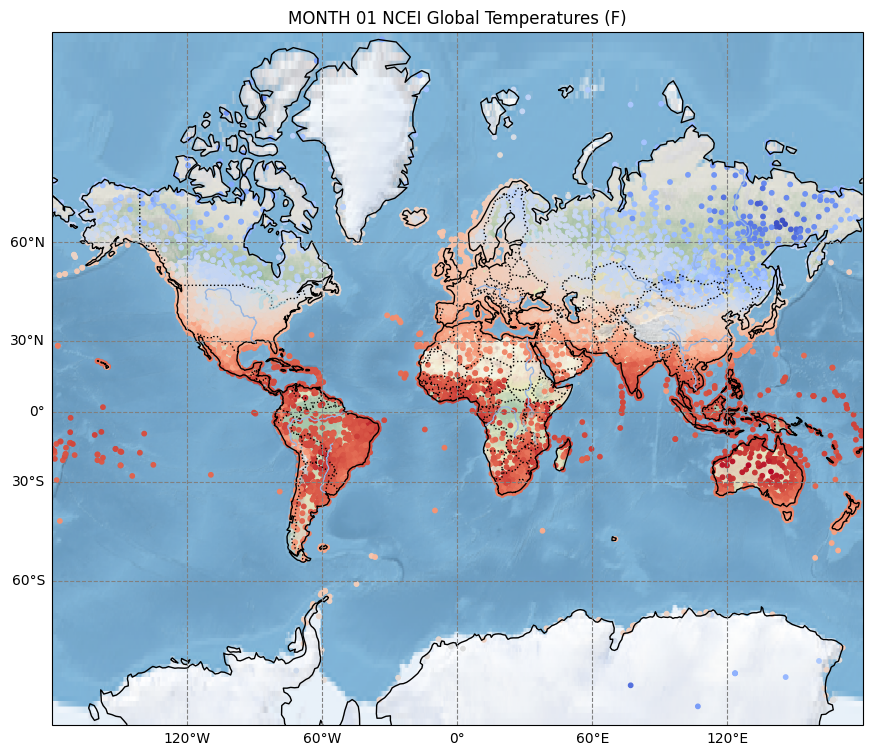

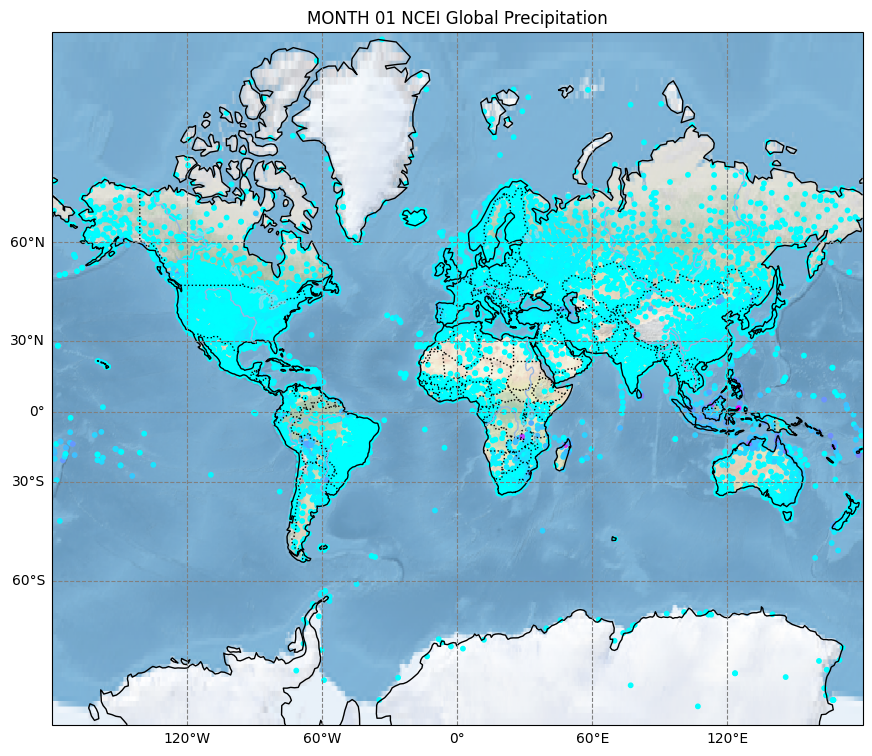

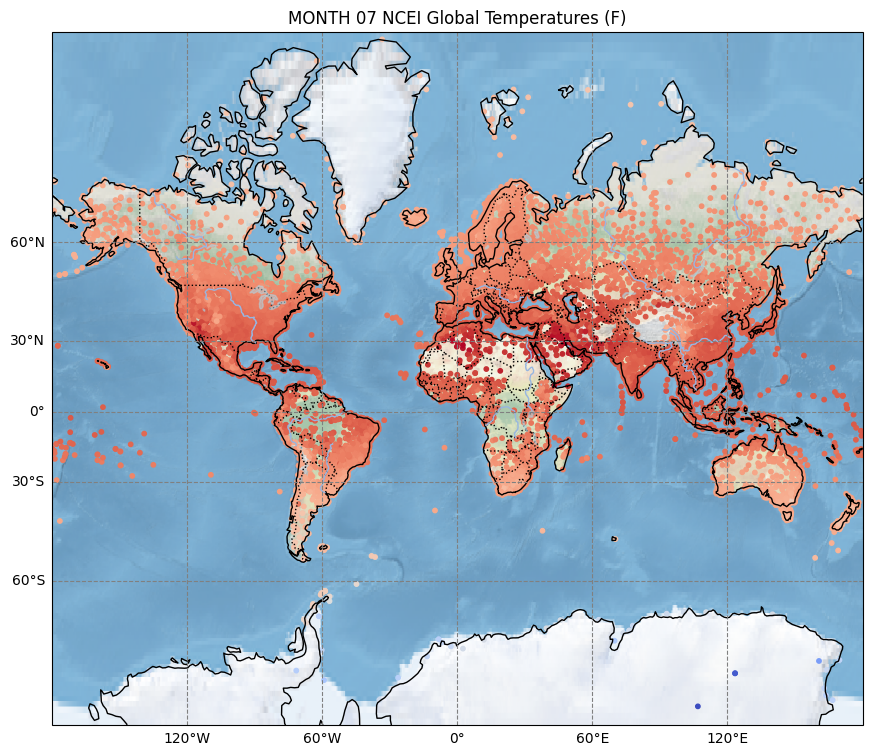

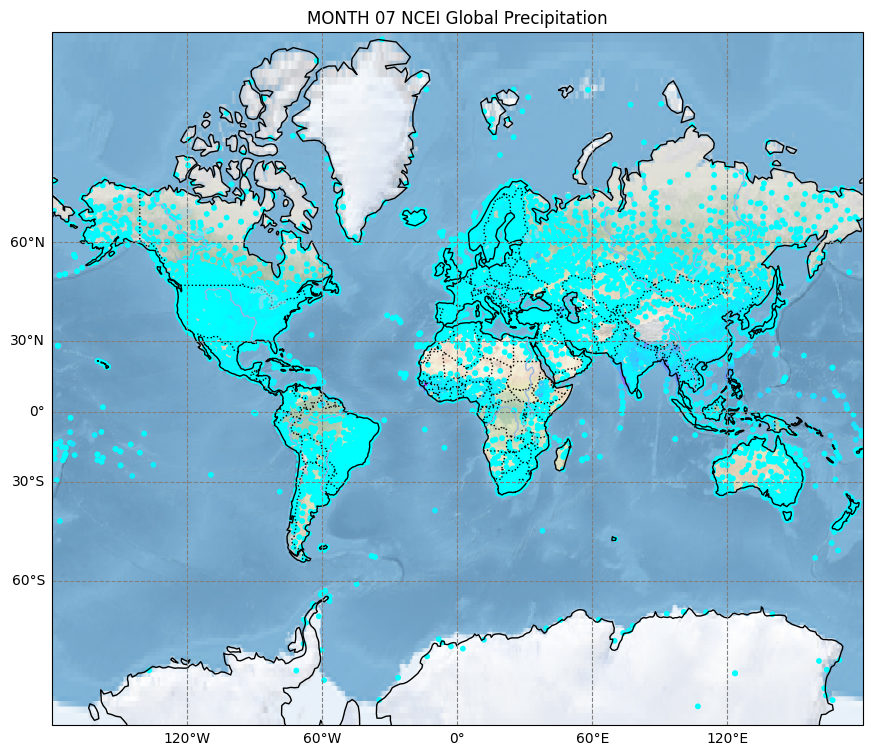

In [50]:
plot_map("MONTH 01 NCEI Global Temperatures (F)",
         full_atmospheric_w_id['LONGITUDE'],
         full_atmospheric_w_id['LATITUDE'],
         full_atmospheric_w_id['1_TEMP'],
         labels=None,
         cmap='coolwarm',
         s=10)

plot_map("MONTH 01 NCEI Global Precipitation",
         full_atmospheric_w_id['LONGITUDE'],
         full_atmospheric_w_id['LATITUDE'],
         full_atmospheric_w_id['1_PRCP'],
         labels=None,
         cmap='cool',
         s=10)

plot_map("MONTH 07 NCEI Global Temperatures (F)",
         full_atmospheric_w_id['LONGITUDE'],
         full_atmospheric_w_id['LATITUDE'],
         full_atmospheric_w_id['7_TEMP'],
         labels=None,
         cmap='coolwarm',
         s=10)

plot_map("MONTH 07 NCEI Global Precipitation",
         full_atmospheric_w_id['LONGITUDE'],
         full_atmospheric_w_id['LATITUDE'],
         full_atmospheric_w_id['7_PRCP'],
         labels=None,
         cmap='cool',
         s=10)

In [51]:
new_features = []

for n_clusters in k_values:
    new_features.append(f"CLIMATE ZONE n_clusters={n_clusters}")
    
print(new_features)

['CLIMATE ZONE n_clusters=2', 'CLIMATE ZONE n_clusters=5', 'CLIMATE ZONE n_clusters=11']


In [52]:
numeric_features_full = numeric_features + new_features

print(numeric_features_full)

['distance_to_water_km', '1_DEWP', '2_DEWP', '3_DEWP', '4_DEWP', '5_DEWP', '6_DEWP', '7_DEWP', '8_DEWP', '9_DEWP', '10_DEWP', '11_DEWP', '12_DEWP', '1_SLP', '2_SLP', '3_SLP', '4_SLP', '5_SLP', '6_SLP', '7_SLP', '8_SLP', '9_SLP', '10_SLP', '11_SLP', '12_SLP', '1_STP', '2_STP', '3_STP', '4_STP', '5_STP', '6_STP', '7_STP', '8_STP', '9_STP', '10_STP', '11_STP', '12_STP', '1_VISIB', '2_VISIB', '3_VISIB', '4_VISIB', '5_VISIB', '6_VISIB', '7_VISIB', '8_VISIB', '9_VISIB', '10_VISIB', '11_VISIB', '12_VISIB', '1_WDSP', '2_WDSP', '3_WDSP', '4_WDSP', '5_WDSP', '6_WDSP', '7_WDSP', '8_WDSP', '9_WDSP', '10_WDSP', '11_WDSP', '12_WDSP', '1_MXSPD', '2_MXSPD', '3_MXSPD', '4_MXSPD', '5_MXSPD', '6_MXSPD', '7_MXSPD', '8_MXSPD', '9_MXSPD', '10_MXSPD', '11_MXSPD', '12_MXSPD', '1_GUST', '2_GUST', '3_GUST', '4_GUST', '5_GUST', '6_GUST', '7_GUST', '8_GUST', '9_GUST', '10_GUST', '11_GUST', '12_GUST', '1_MAX', '2_MAX', '3_MAX', '4_MAX', '5_MAX', '6_MAX', '7_MAX', '8_MAX', '9_MAX', '10_MAX', '11_MAX', '12_MAX', '1_

In [53]:
numeric_merged_df = merged_df.merge(pivot_df, on='NAME', how='inner')

numeric_merged_df

,Powerplant Name,Capacity (MW),Primary Fuel,Owner,Source,distance_to_water_km,Longitude,Latitude,LONGITUDE_left,LATITUDE_left,...,3_RH,4_RH,5_RH,6_RH,7_RH,8_RH,9_RH,10_RH,11_RH,12_RH
0,PARANA,845.26,Other,AES ARGENTINA GENERACION S.A.,Ministerio de Energía y Minería,0.581258,-60.1718,-33.3549,-60.1718,-33.3549,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
1,SAN NICOLAS,644.00,Coal,AES ARGENTINA GENERACION S.A.,Ministerio de Energía y Minería,0.721664,-60.1729,-33.3562,-60.1729,-33.3562,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
2,CT ARRECIFES,20.00,Oil,AGGREKO ARGENTINA SRL,Ministerio de Energía y Minería,41.358227,-60.1297,-34.0414,-60.1297,-34.0414,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
3,CT GENERAL VILLEGAS,23.49,Oil,AGGREKO ARGENTINA SRL,Ministerio de Energía y Minería,156.359842,-62.9981,-35.0347,-62.9981,-35.0347,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
4,CT MAGDALENA,25.00,Oil,APR ENERGY SRL,Ministerio de Energía y Minería,0.000000,-57.4839,-35.1001,-57.4839,-35.1001,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29905,Vidin Works power station,120.00,Coal,Vidachim,GCPT,1.213469,22.8509,43.9484,22.8509,43.9484,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
29906,Kelvin power station,600.00,Coal,Aldwych International Ltd,GCPT,50.922046,28.1940,-26.1158,28.1940,-26.1158,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
29907,Pretoria West power station,180.00,Coal,0,GCPT,71.556524,28.1467,-25.7584,28.1467,-25.7584,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
29908,Rooiwal power station,300.00,Coal,Tshwane Electricity Division,GCPT,59.081717,28.2376,-25.5550,28.2376,-25.5550,...,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0


| Predictive Model | With Engineered Feature | Without Engineered Feature|
|---|---|---|
| Logistic Regression (baseline) | 0.3948 | 0.3873  |
| At least one ensemble method (Random Forest Classifier, Bagging, Gradient Boosting, or other ensemble techniques) | 0.5891 | 0.5840 |
| One additional model from: Decision Tree Classifier or another ensemble method | 0.5543 | 0.5583 |

<h3>Step 4: Build Predictive Models</h3>

Build at least 3 different predictive models. Your problem will determine which type:

For Classification Problems (predicting a category):

[x]Required: Logistic Regression (baseline).<br>
[x]Required: At least one ensemble method (Random Forest Classifier, Bagging, Gradient Boosting, or other ensemble techniques).<br>
[x]Required: One additional model from: Decision Tree Classifier or another ensemble method.<br>

Evaluation Metrics: Report appropriate metrics for your problem type:

For classification:

[x]Accuracy<br>
[x]Precision<br>
[x]Recall<br>
[x]F1-score<br>
[ ]Confusion Matrix<br>

In [54]:
y = numeric_merged_df['Primary Fuel']

X = numeric_merged_df[numeric_features_full].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = {
    'logistic_regression': {
        'model': LogisticRegression(
            solver='newton-cholesky', 
            class_weight='balanced',
        ),
        'evaluation_metrics_w_ef': [],
        'evaluation_metrics_wo_ef': []
    },
    'random_forest': {
        'model': RandomForestClassifier(),
        'evaluation_metrics_w_ef': [],
        'evaluation_metrics_wo_ef': []
    },
    'decision_tree': {
        'model': DecisionTreeClassifier(),
        'evaluation_metrics_w_ef': [],
        'evaluation_metrics_wo_ef': []
    }
}

def run_model(model_name, model_function, X_train, X_test, y_train, y_test):
    model_pipeline = Pipeline([
        ('scaler', StandardScaler()),
        (model_name, model_function)
    ])

    model_pipeline.fit(X_train, y_train)

    y_pred = model_pipeline.predict(X_test)

    accuracy_score = metrics.accuracy_score(y_test, y_pred)
    
    precision_score = metrics.precision_score(y_test, y_pred, average='weighted', zero_division=0)

    recall_score = metrics.recall_score(y_test, y_pred, average='weighted', zero_division=0)
    
    f1_score = metrics.f1_score(y_test, y_pred, average='weighted', zero_division=0)

    return accuracy_score, precision_score, recall_score, f1_score

print(f"With engineered feature.")
for key, value in models.items():
    print(f"Evaluating {key} model.")
    
    accuracy_score, precision_score, recall_score, f1_score = run_model(key, models[key]['model'], X_train, X_test, y_train, y_test)
                                   
    models[key]['evaluation_metrics_w_ef'] = [accuracy_score, precision_score, recall_score, f1_score]

for k in k_values:
    del X_train[f"CLIMATE ZONE n_clusters={k}"]
    
    del X_test[f"CLIMATE ZONE n_clusters={k}"]
    
print(f"Without engineered feature.")
for key, value in models.items():
    print(f"Evaluating {key} model.")
    
    accuracy_score, precision_score, recall_score, f1_score = run_model(key, models[key]['model'], X_train, X_test, y_train, y_test)
                                   
    models[key]['evaluation_metrics_wo_ef'] = [accuracy_score, precision_score, recall_score, f1_score]

With engineered feature.
Evaluating logistic_regression model.
Evaluating random_forest model.
Evaluating decision_tree model.
Without engineered feature.
Evaluating logistic_regression model.
Evaluating random_forest model.
Evaluating decision_tree model.


In [55]:
evaluation_metrics_w_ef = ['accuracy_score_w_ef','precision_score_w_ef','recall_score_w_ef','f1_score_w_ef']

evaluation_metrics_wo_ef = ['accuracy_score_wo_ef','precision_score_wo_ef','recall_score_wo_ef','f1_score_wo_ef']

model_evaluation = pd.DataFrame.from_dict(models).T

model_evaluation[evaluation_metrics_w_ef] = model_evaluation['evaluation_metrics_w_ef'].apply(lambda x: pd.Series(x))

model_evaluation[evaluation_metrics_wo_ef] = model_evaluation['evaluation_metrics_wo_ef'].apply(lambda x: pd.Series(x))

<h3>Step 5: Show the Impact</h3>

Compare models that DON'T use your Phase 1 discoveries vs. models that DO use them.

Methodology:

[x]Use the same train/test split for fair comparison<br>
[x]Include a baseline model (no Phase 1 features) for comparison<br>
[x]Report at least 2-3 appropriate metrics (see Step 4 for metric requirements)<br>
[x]Create a comparison table showing performance metrics for all models.<br>

Explain:

The engineered feature [CLIMATE ZONE] did not offer significant improvements in accuracy. The features that are used to cluster atmospheric data into [CLIMATE ZONES] are also used in the predictive models, so it isn't unexpected.

In [56]:
model_evaluation[['accuracy_score_w_ef', 'accuracy_score_wo_ef']]

,accuracy_score_w_ef,accuracy_score_wo_ef
logistic_regression,0.308425,0.307589
random_forest,0.601137,0.598462
decision_tree,0.578569,0.578402


In [57]:
model_evaluation[['precision_score_w_ef', 'precision_score_wo_ef']]

,precision_score_w_ef,precision_score_wo_ef
logistic_regression,0.483301,0.483988
random_forest,0.600553,0.598090
decision_tree,0.580905,0.582116


In [58]:
model_evaluation[['recall_score_w_ef', 'recall_score_wo_ef']]

,recall_score_w_ef,recall_score_wo_ef
logistic_regression,0.308425,0.307589
random_forest,0.601137,0.598462
decision_tree,0.578569,0.578402


In [59]:
model_evaluation[['f1_score_w_ef', 'f1_score_wo_ef']]

,f1_score_w_ef,f1_score_wo_ef
logistic_regression,0.355911,0.355237
random_forest,0.600731,0.598100
decision_tree,0.579577,0.580095


<h2>AI Generated Code and Relevant Figures</h2>

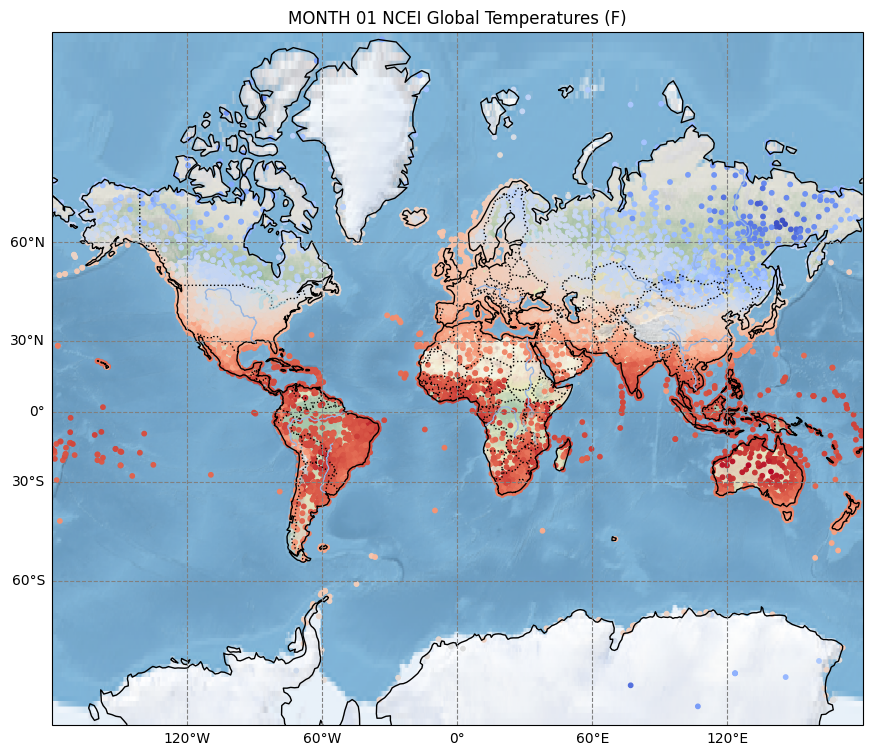

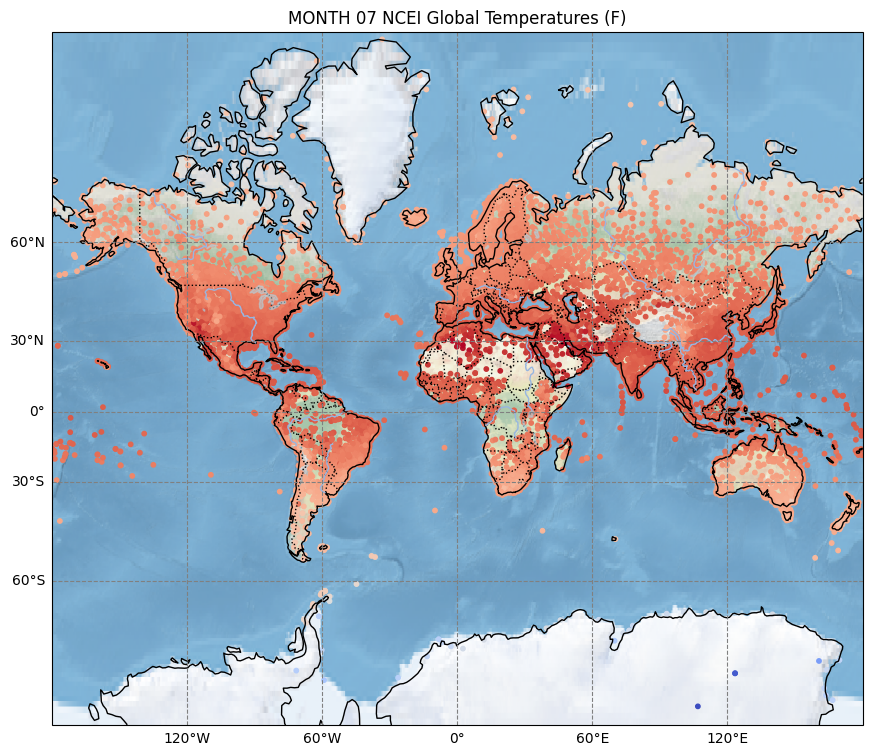

In [60]:
plot_map("MONTH 01 NCEI Global Temperatures (F)",
         full_atmospheric_w_id['LONGITUDE'],
         full_atmospheric_w_id['LATITUDE'],
         full_atmospheric_w_id['1_TEMP'],
         labels=None,
         cmap='coolwarm',
         s=10)

plot_map("MONTH 07 NCEI Global Temperatures (F)",
         full_atmospheric_w_id['LONGITUDE'],
         full_atmospheric_w_id['LATITUDE'],
         full_atmospheric_w_id['7_TEMP'],
         labels=None,
         cmap='coolwarm',
         s=10)

In [61]:
*#=============================================================================
# Code generated by Artificial Intelligence (Google AI)
# Date: 2025-12-08
# Prompt: "The code demonstrates how to use Matplotlib subplots 
# to create distinct seaborn heatmaps for different DataFrame columns, allowing 
# each plot to have its own color scale and color bar.
# =============================================================================

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Sample Data: Columns have very different scales (A: 0-10, B: 0-100, C: 0-1000)
data = {
    'Col_A_Temp': [1, 5, 8, 10, 2],
    'Col_B_Humidity': [20, 45, 60, 80, 50],
    'Col_C_Pressure': [800, 900, 950, 1000, 850]
}
df = pd.DataFrame(data, index=['R1', 'R2', 'R3', 'R4', 'R5'])

# 1. Create a figure and subplots
# nrows=1, ncols=3 creates 3 side-by-side plots.
# sharey=True keeps the row labels consistent.
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), sharey=True)

# Define different colormaps for each column
cmaps = ['Blues', 'Greens', 'Reds']
columns = df.columns

# 2. Loop through columns and plot each one individually on its own axis
for i, col in enumerate(columns):
    # Select only the current column data
    data_subset = df[[col]]
    ax = axes[i]
    cmap_val = cmaps[i]
    
    # Plot the heatmap for the single column onto the specific axis (ax)
    sns.heatmap(
        data=data_subset,
        ax=ax,         # Assign to the subplot axis
        cmap=cmap_val, # Use the specific colormap
        cbar=True,     # Ensure a colorbar is drawn for THIS plot
        annot=True,    # Add numerical labels
        fmt=".1f"      # Format annotations
    )
    
    # Customize the title for clarity
    ax.set_title(f'{col} Heatmap')
    # For all but the first plot, remove the redundant Y-axis label/ticks if shared
    if i > 0:
        ax.set_ylabel('')
        ax.tick_params(left=False)

plt.tight_layout()
plt.show()


SyntaxError: invalid syntax (1998707472.py, line 1)